# **A sneak peek into Tomas's brain/Want to see inside the living Brain?/What are you interested in: Tomas's Anatomy or pathology?**

## **Introduction**

Brain imaging, commonly referred to as neuroimaging, is a type of imaging that allows us to study the structure and function of the living brain. Functional imaging with even greater functional contrast-to-noise ratios for increased spatial resolution is possible with ultrahigh magnetic field strengths (7 T and more) (T. Vu et al., 2017). Neuroimaging makes use of a range of approaches. One of them is fMRI, a non-invasive method for researching brain activity that collects a series of brain scans as the individual performs a task in particular scenarios. fMRI is gaining popularity because it provides an appealing balance of temporal and spatial resolution. What exactly are we measuring? We are measuring signals that are mostly affected by the level of oxygen in the blood. It is known as Blood Oxygen Level Dependent(BOLD), and it gives us an indirect glimpse of neuronal activity. A short burst of neuronal activity produces a stereotypical BOLD signal, called the Haemodynamic Response Function. fMRI is a convolution of the hemodynamic response function (HRF) and unmeasured brain activity (Rangaprakash et al., 2018). 





Can we use the data obtained from the MRI scanners directly? Well the answer is no. The precision with which the event-related hemodynamic response to various stimuli may be calculated for a given length of imaging time is a significant problem in the design and analysis of event-related or single-trial functional magnetic resonance imaging (fMRI) research(Dale, 1999). Hence the fMRI data goes through a number of preprocessing steps. Preprocessing is necessary since the functional images must be aligned with the anatomy. The common justification is that more variance will be collected and regressed out of the data(Calhoun et al., 2004b). 


We use the General linear model(GLM) to analyze the data, after we've completed the appropriate preprocessing. The Finite Impulse-Response model(FIR) attempts to estimate the response generated at a range of timepoints following an event using the GLM. We can rebuild the average post-event signal time-course by assessing response intensity at various intervals after the events of interest. Deconvolution is the process of determining what response our neural events were convolved with to form our signals by fitting the shape of the HRF. This produces a design matrix, which we can use to estimate a number of regressors that reflect various post-event time-points.


As a result, the signal variance will be dispersed among the many regressors, allowing us to estimate which neuronal responses were convolved to form our signal. In this experiment, we attempt to map the BOLD response in the visual cortex using data gathered by presenting our subject with flashing checkerboard stimuli. The intervals between presentations were chosen at random from an exponential function, which has been found to be appropriate for estimating the form of the hemodynamic response function (HRF) (Taylor et al., 2018).

## Installation

The installation and setup cells may take a little while to run as they fetch and install all the required software. It's also likely there's going to be a LOT of outputs that are irrelevant. Feel free to delete the output of this cell after it runs to free up space. 

In [ ]:
# this cell installs some dependencies. 
# feel free to disregard the output this generates

!apt -qq install inkscape > /dev/null
!pip -qq install nibabel nilearn
!pip -qq install git+https://github.com/gallantlab/pycortex.git#egg=pycortex



Extracting templates from packages: 100%
     |████████████████████████████████| 10.1 MB 24.7 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done


In [ ]:
# after these basic installs, we can import our required packages. 

import numpy as np
import scipy as sp
import nibabel as nb
import nilearn as nl
from nilearn.surface import load_surf_data
import os, shutil, urllib.request

from scipy.signal import periodogram
from matplotlib import rc
rc('animation', html='jshtml')

import matplotlib.pyplot as plt
%matplotlib inline 

### Download of data: surfaces for plotting and project data

Both the surface data we'll use for visualization and the project fMRI data are on figshare. From Figshare, we can download the data and place them in the Colab virtual machine. You don't have to read/understand this code - it's all boilerplate stuff to set up Colab's virtual machine so that it works with our data. 

***More important:*** For a brief description of the data of the different projects, --and a couple of very important parameters of these acquisitions which you will need later-- please consult the [figshare website](https://figshare.com/articles/dataset/fMRI_Teaching_Materials/14096209)

In [ ]:
#
# this cell ensures that we can work with our own surface from within the colab environment
#

os.makedirs('/content/pycortex/db', exist_ok=True)
os.makedirs('/content/pycortex/colormaps', exist_ok=True)
os.makedirs('/content/data', exist_ok=True)

wrong_filestore_location = 'build/bdist.linux-x86_64/wheel/pycortex-1.3.0.dev0.data/data/share/pycortex/'
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'r') as f:
  file_source = f.read()
replace_string = file_source.replace(wrong_filestore_location, '/content/pycortex/') #save output 
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'w') as f:
  f.write(replace_string)   

os.chdir('/tmp/')
!git clone https://github.com/gallantlab/pycortex.git
!cp /tmp/pycortex/filestore/colormaps/* /content/pycortex/colormaps/

#
# and we'll download our average hcp subject for pycortex visualization
#

pycortex_sj_URL = "https://ndownloader.figshare.com/files/25768841"

urllib.request.urlretrieve(pycortex_sj_URL, os.path.join('/content/pycortex/db', 'hcp_999999.zip'))
!unzip -qq /content/pycortex/db/hcp_999999.zip -d /usr/share/pycortex/db/

#
# and then download the projects' data from figshare
#

timeseries_data_URL = 'https://ndownloader.figshare.com/articles/14096209/versions/3'
urllib.request.urlretrieve(timeseries_data_URL, os.path.join('/content/data', '14096209.zip'))
!unzip -qq /content/data/14096209.zip -d /content/data/
!unzip -qq /content/data/hrf_mapper_59k.zip -d /content/data/hrf_mapper_59k/
!unzip -qq /content/data/prf_mapper_59k.zip -d /content/data/prf_mapper_59k/
!unzip -qq /content/data/soma_mapper_59k.zip -d /content/data/soma_mapper_59k/
!unzip -qq /content/data/atlas.zip -d /content/data/

Cloning into 'pycortex'...
remote: Enumerating objects: 23882, done.
remote: Counting objects: 100% (2286/2286), done.
remote: Compressing objects: 100% (778/778), done.
remote: Total 23882 (delta 1529), reused 2152 (delta 1449), pack-reused 21596
Receiving objects: 100% (23882/23882), 476.15 MiB | 22.33 MiB/s, done.
Resolving deltas: 100% (18211/18211), done.


## Putting these tools to first use

Ok, why all this complicated hassle? Well, we want you to have a playground that allows you to really get to know the data. 

#### Where are the data files?

The data have now been downloaded, and you can check out the data on disk by using the command line. For example, in a code cell you can preface the line with an exclamation mark to give a commandline command: 

`!ls /content/data/prf_mapper_59k`

Will give you the contents of the prf experiment data folder. But, on the left in the CoLab UI you can also find a file navigator, next to the table of contents, search and code snippet elements. Feel free to have a look around!

#### Okay, but what can we do with these tools?

After downloading and auto-editing the data required for working with pycortex, we can now import pycortex. We'll use pycortex for plotting of the results, which is using only a subset of its awesome features. Remember that [brain viewer of semantic maps](http://gallantlab.org/huth2016/)? Also made using pycortex! If you have some spare time and want to play around with this awesome package, please have a look at the [pycortex docs](https://gallantlab.github.io/pycortex/)

In [ ]:
import cortex as cx

And, just to highlight the type of visualisation we'll be doing, a quick demo of the way we'll be using it. We'll be using the surface from the Human Connectome Project, which we named `hcp_999999`. So that's the 'subject' name we use to get and plot surface data using pycortex. 

Don't worry if you see a bunch of warnings and stuff - it will create the figure we asked for from what is in essence a single line of code: the curvature of the cortical surface of this standard surface. **Gorgeous!** 

Feel free to change the datatype to `'thickness'`, for example. Also **Gorgeous!**

Generating a flatmap cache
Failed to get connection
** (inkscape:3191): CRITICAL **: 11:11:52.095: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3191): CRITICAL **: 11:11:52.095: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3191): CRITICAL **: 11:11:52.096: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


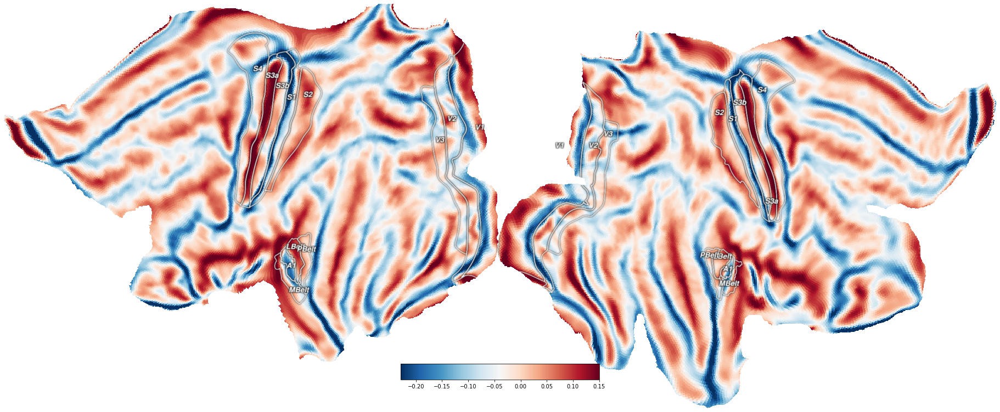

In [ ]:
curv_vertices = cx.db.get_surfinfo(subject='hcp_999999', type='curvature')
cx.quickshow(curv_vertices);

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Flatmaps?

But what the hell are we looking at, even? The cortical surface or ribbon is topologically a ball per hemisphere. That is, each hemisphere can be inflated to the shape of a sphere (let's not get stuck on the question how a hemisphere can also be a sphere :-) ). Flatmaps are created by cutting the inflated cortical surface at specific locations (see the black lines in the left figure), and then letting the computer flatten the resulting mesh into a planar surface. 

<img src="https://github.com/VU-Cog-Sci/wiki/raw/master/imgs/flatten/image9.png" alt="where do we cut the surface" width="45%" style="align:left;"/> <img src="https://universe-review.ca/I10-13-BrainMap3.jpg" alt="Visual, auditory and somatosensory brain regions" width="45%" style="align:right;"/>

This flatmapping has the advantage that we can view the entire cerebral cortex in one fell swoop, but the downside is that it is hard to orient yourself to where things are. That's why we've added some lines that surround certain labeled regions of interest - they are the visual, auditory and somatosensory/motor cortex. In the right image they are the blue, red and green areas of the brain, respectively. We're using exactly the flattened surfaces of the right column in the right figure, but ours are rendered side-by-side. Recognize them from the curvature figure?

Take a few minutes to orient yourself on these surfaces, using the atlas in the right figure. Where are the darker areas of this atlas on the inflated surfaces, and where do they end up on the flattened surface? Same for the coloured regions - make sure you have an idea of where things are. This will greatly increase your maneuverability in the brain. 

You'll need that maneuverability because we'll be working with surface data in this project: all the data you will load is surface-based, and should be visualized as shown in this introduction. In many ways, surface-based fMRI data is simpler than volume-based data. Instead of 4-dimensional, it's 2-dimensional: vertices by timepoints. This makes it less of a bookkeeping hassle to use. Let's have a look at some of your fMRI time-course data!


## Loading the functional data for your project

In the cell below we're loading the functional MRI files you'll be working with. There's a different set of files that you open and read depending on the project that you'll be doing. Once loaded, though, all of these datasets have the same format - they're all formatted for the same surface that you've already plotted data into. 

In [ ]:
# Here, I'm using python's awesome f-string functionality to load the data in a structured way across hemisperes. 
# Once the data have been loaded (for plotting and stuff), we don't have to care about hemispheres so much anymore. 
# There are 3 separate versions here, one for each project-dataset.


#########################################################################################################
###############
############### pRF mapping data
###############
#########################################################################################################

# tseries_raw = np.nan_to_num(np.concatenate([load_surf_data(
#         os.path.join('/content/data/prf_mapper_59k', f'sub-02_task-prf_space-59k_hemi-{hemi}_run-median_desc-bold.func.gii'))
#          for hemi in ['L', 'R']]))

#########################################################################################################
###############
############### somatotopic mapping data
###############
#########################################################################################################

# tseries_raw = np.concatenate([load_surf_data(
#         os.path.join('/content/data/soma_mapper_59k', f'sub-01_ses-01_task-soma_run-median_space-59k_hemi-{hemi}_sg_psc.dtseries.gii'))
#          for hemi in ['L', 'R']])

#########################################################################################################
###############
############### hrf mapping data
###############
#########################################################################################################

tseries_raw = np.concatenate([load_surf_data(
        os.path.join('/content/data/hrf_mapper_59k', f'sub-012_ses-2_task-hrfmapper_run-1_bold_space-T1w_preproc_59k.{hemi}.dtseries.gii'))
         for hemi in ['L', 'R']])


# and, we'll check the shape of the data to see whether things make sense
# data should be shaped as vertices by timepoints, and each hemisphere is 59k vertices - hence the name :) 
print(tseries_raw.shape)

(118584, 440)


## Raw Data Observations
### What amount of preprocessing has already been done?

If the signals have been filtered already, there should be no drifts in the data. Also, if the data time-courses have already been z-scored or converted to percent signal change, the mean of the signals should already be 0. If the data are in 'units' of % signal change, the maximal excursions of the signal timecourse will be on the order of 10-20. If they've been z-scored, their standard deviation should be exactly 1 (duh!). 

Like we learned in the preprocessing lecture and practical, the standard deviation over time also gives us a lot of valuable information regarding signal quality in non-z-scored data. Let's have a quick look at these different aspects of the data on flatmaps. This will also show us whether we were scanning the whole brain or not - an aspect of the data acquisition that you may want to mention in your report...

**Note**
If we plot data that didn't come from pycortex's surface data itself, but from our own files, we need to supply a subject. Adding the colormap is just for clarity. 

In [ ]:
# Note that we saw in the cell above that the second dimension is time, 
# so the axis on which we take the mean and standard deviation is 1
f = cx.quickshow(cx.Vertex(tseries_raw.mean(axis=1), subject='hcp_999999', cmap='seismic'));
f.suptitle('Mean over time')

f = cx.quickshow(cx.Vertex(tseries_raw.std(axis=1), subject='hcp_999999', cmap='inferno'));
f.suptitle('Standard Deviation over time');

Output hidden; open in https://colab.research.google.com to view.

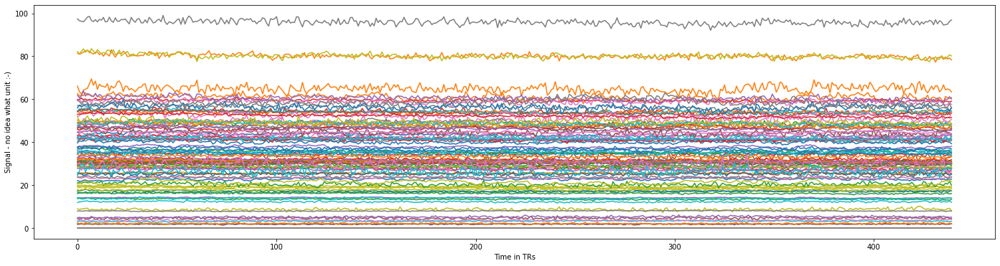

In [ ]:
# now, let's get some random time-courses to check whether there's still drift:
random_vertices = np.random.choice(np.arange(tseries_raw.shape[0]), 100)
f = plt.figure(figsize=(24,6))
plt.plot(tseries_raw[random_vertices].T)
plt.xlabel('Time in TRs')
plt.ylabel('Signal - no idea what unit :-)');

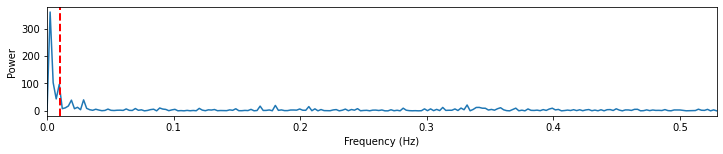

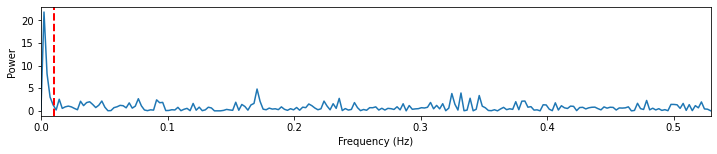

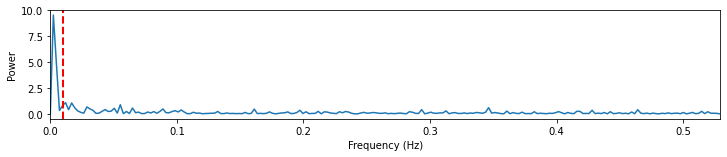

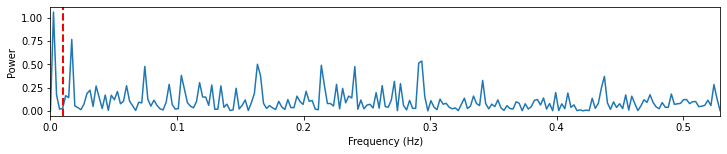

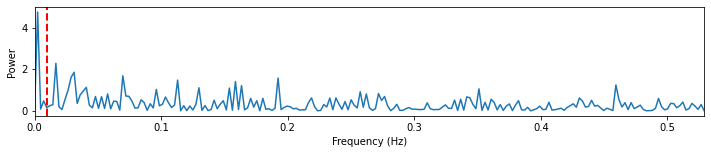

In [ ]:
# Following preprocessing steps from the tutorial.
# check for slow drift
tr = 0.945
f = 1 / tr  # f is the sampling rate/frequency

rand_vertices = np.random.choice(np.arange(tseries_raw.shape[0]), 5) 

for ind in rand_vertices:
    freq, pow = periodogram(tseries_raw[ind], f) #periodogram used for fourier transform
    plt.figure(figsize=(12, 2))
    plt.plot(freq, pow)
    plt.xlim(0, freq.max())
    plt.ylabel('Power')
    plt.xlabel('Frequency (Hz)')

    # There are no guidelines for determining the cutoff of your high-pass filter, although most experts recommend a cutoff of 100 seconds (i.e., of 0.01 Hz). 
    plt.axvline(x=0.01,color='r',ls='dashed', lw=2)

 #Findings: There is a drift in the data
#It doesnt seem like there was a high pass filtering. Do we need to perform a high pass filtering?

Now, depending on your dataset you may see that the top of the brain is brighter than the bottom. This is due to the fact that the top of the brain is closer to the coils. Moreover, you may see some really interesting web-like pattern on the surfaces that you've plotted. Like this:

<img style="float:right; align:right top; margin:10px; padding: 25px 25px 25px 25px;" src="https://i.imgur.com/lqPTAzK.png" alt="Model pipeline" width="500" align="right" />

What is that stuff? Why isn't it homogeneous? The answer is, we're looking at blood, and at 7 Tesla (at which all these data were acquired) these veins show up very strongly. Their presence has a strong influence on whether you can find any 'activation', as they may get in the way of what you want to find. Keep this in mind!

### Questions concerning signal quality

From these simple surface and time-course plots above, we can immediately gather a couple of things. Try to answer the following questions from both the flatmaps and the random time-courses. 

1.   have these data been z-scored or percent signal changed? **Check the colorbars!** What would they look like if they'd been z-scored?


2.   have these data been high-pass filtered? **Check the timecourses!**


3.   where do you see the biggest signal fluctuations? What are the likely origins of these fluctuations? 



You can use these insights in writing the data description section of your report! Note that there are differences between the different project-datasets, so make sure you inspect your own!

<font color='red'>-- Important: --</font>

**Your conclusions about the state of the data for your project will tell you what to do: you now have to decide whether to perform additional preprocessing, such as temporal filtering, percent signal change conversion, etc.**

**Write the results** 


## Atlas tools

It's a very powerful thing to be able to plot stuff on the entire cerebral cortex in one go. But sometimes you want to focus on a single brain region. You can use your own methods to define regions of interest, for example using a separate mapper experiment that allows you to select voxels/vertices of interest - within which you'll then perform your analysis of interest. 

But we'll use the existing multi-modal parcelation atlas from the Human Connectome Project, from the [Glasser et al Nature study](https://www.nature.com/articles/nature18933) that was mentioned a couple of times in the lectures. This is the atlas shown in the right flatmap figure above, in the 'Flatmaps' section.

The following cells show how to select a given ROI's data - something that you may want to do quite a lot in your own analyses. It serves to zoom into a specific region of interest, but also means that you can 'pilot' time-consuming analyses on smaller amounts of data while still taking care to test your entire analysis. 

In [ ]:
# we read in the atlas data, which consists of 180 separate regions per hemisphere. 
# These are labeled separately, so the labels go to 360. 
# To work with them in both hemispheres simultaneously, we mod by 180. 
atlas_data = np.concatenate([load_surf_data(
        os.path.join('/content/data/atlas', f'Q1-Q6_RelatedParcellation210.CorticalAreas_dil_Colors.59k_fs_LR.dlabel.{hemi}.gii'))
         for hemi in ['L', 'R']])
atlas_data_both_hemis = np.mod(atlas_data, 180)

(array([13360.,   689.,  3674.,  1281.,  2852.,  2623.,   737.,  1301.,
         1086.,   467.,   833.,   392.,   437.,   847.,   550.,  1117.,
          869.,  1097.,   585.,   387.,  1252.,  1577.,  1294.,   703.,
         1508.,  1052.,  1216.,  1004.,  1540.,  3284.,  1637.,   771.,
          540.,   511.,   793.,   943.,   523.,  1547.,   925.,  1100.,
         1325.,  1111.,   433.,  1534.,   669.,   982.,  1420.,   435.,
         1488.,   849.,  1030.,  1334.,   443.,  1583.,   692.,  1155.,
          873.,   342.,  1257.,   844.,  1084.,   553.,   902.,   590.,
         1124.,  1529.,   567.,  1260.,  1056.,  1050.,   801.,   548.,
         1379.,  1939.,  1735.,  1547.,   596.,  1526.,   844.,  1067.,
          696.,  1089.,  1999.,  3142.,  1165.,   322.,   518.,   524.,
          500.,   660.,   251.,   659.,   684.,   988.,   927.,   439.,
          868.,   988.,   934.,   831.]),
 array([  0.  ,   1.79,   3.58,   5.37,   7.16,   8.95,  10.74,  12.53,
         14.32,  16.11

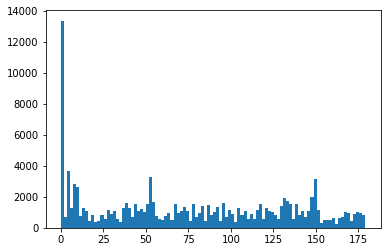

In [ ]:
plt.hist(atlas_data_both_hemis, bins=100)

In [ ]:
# https://numpy.org/doc/stable/reference/generated/numpy.unique.html
values, counts = np.unique(atlas_data_both_hemis, return_counts=True) #reconstructs the input values from the unique values and counts
values, counts

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

### Selecting an ROI

One can now easily use a test to create boolean arrays into a specific ROI. For example, we can check which ROI is indexed by the number 1. Make sure you understand what I did with the `vmin` and `vmax` settings of the `Vertex` object! You may be able to use these little tricks later!

Failed to get connection
** (inkscape:3353): CRITICAL **: 11:12:28.151: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3353): CRITICAL **: 11:12:28.151: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3353): CRITICAL **: 11:12:28.151: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


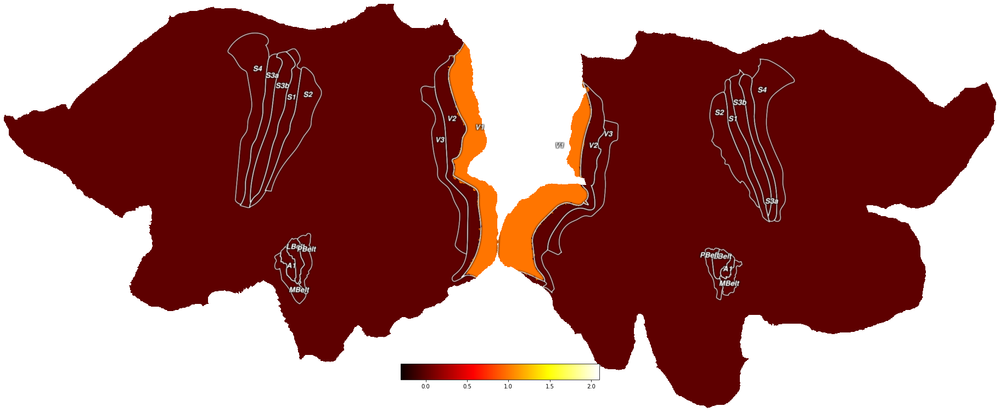

In [ ]:
f = cx.quickshow(cx.Vertex(atlas_data_both_hemis == 1, subject='hcp_999999', cmap='hot', vmin=-0.3, vmax=2.1));

This means we can also select those parts of the brain and single out the responses from just a single region of interest! That should be much more manageable. For now, we'll select the region we highlighted above, V1 - the first region of the cortical visual hierarchy. It turns out that 2 out of our 3 experiments did something very very visual, with the third also showing visual stimuli. So let's see what we end up with! Once you've understood the idea of the following code cell, feel free to experiment with the actual index of the ROI this analysis works with!

***Note 1:*** whether this raw data visualization is very informative depends on your experiment. So, don't worry if this doesn't show you anything here. 

***Note 2:*** See how I'm trying to label all my figure axes so that it's clear what the units and elements of the data are? **It's very important that you do the same for your report!**

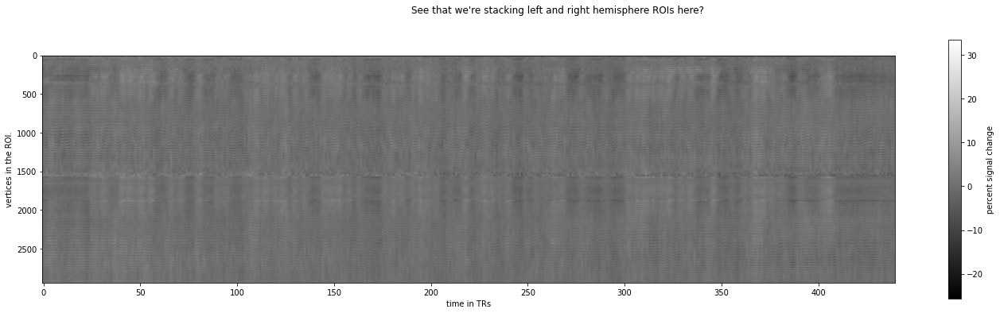

In [ ]:
roi_boolean_mask = atlas_data_both_hemis == 1

# but let's look at the actual signals after percent signal change conversion. 
def psc(data):
  """take percent signal change of data along axis 1. 
  This implementation is a bit idiosyncratic since 
  it uses the median instead of the mean of the signal.
  For sparse signals with very strong activations (such as those at 7T)
  this approach makes sense. Can you imagine why?"""
  # crudely checking whether psc hasn't already happened, in which case do nothing
  if np.mean(data) < 0.5:
    return data
  return ((data.T/np.median(data, 1)).T - 1) * 100

f = plt.figure(figsize=(24,6))
plt.imshow(psc(tseries_raw[roi_boolean_mask]), aspect=1/25, cmap='gray')
plt.xlabel('time in TRs')
plt.ylabel('vertices in the ROI.')
plt.colorbar(label='percent signal change')
f.suptitle("See that we're stacking left and right hemisphere ROIs here?");

To help you out a bit, here's a dictionary that gives you the indices in the atlas for the regions that are outlined in the flatmaps. This may help you find your way later on :-)

In [ ]:
roi_index_dict = {
    # somatosensory:
    'CS1_4': 8, 'CS2_3a': 53, 'CS3_3b': 9, 'CS4_1': 51, 'CS5_2': 52,
    # auditory:
    'A1': 24, 'PBelt': 124, 'MBelt': 173, 'LBelt': 174, '52': 103, 'RI': 104,
    # low-level visual:
    'V1': 1, 'V2': 4, 'V3': 5,
    # mid-level and high-level visual:
    'V3A': 13, 'V3B': 19, 'IPS1': 17, 'LIPv': 48, 'LIPd': 95, 
    'VIP': 49, 'FEF': 10, 'MST': 2, 'MT': 23, 'LO1': 20, 'LO2': 21, 'LO3': 159
    }

# Project 3: Haemodynamic Response Mapper

This section will explain the experiment, background and analysis plans for the HRF-mapper dataset.  You should feel free to use any and all information in this "Project Explanation" section in your own report. Before going through this section, though, read [our explanation of deconvolution](https://nideconv.readthedocs.io/en/latest/tutorials/plot_what_is_deconvolution.html), and the following relevant but advanced article: [A temporal decomposition method for identifying venous effects in task-based fMRI, Kay et al, 2020](https://www.nature.com/articles/s41592-020-0941-6), as well as the Boynton paper you already read from Canvas. If you have any questions about the type of experiment we're going to be looking at, and the different analysis steps, please ask me.

## Haemodynamic Response Mapper: the Goal, and the Experiment.

The shape of the haemodynamic response is usually assumed in standard fMRI analysis. But as we're moving to 7T, we're having to make sure that our methods and assumptions still work. Can we still depend on a reasonably fixed shape of the BOLD response, or do we have to take other things into account? In this experiment, we mapped the BOLD response in visual cortex. 

How do you go about this? Well, in this exceedingly simple experiment, we showed brief, full-screen flickering checkerboard stimuli to our participant (Tomas). The intervals between the presentations were drawn randomly, and more specifically from an exponential distribution. We know from [theoretical work](https://pubmed.ncbi.nlm.nih.gov/11144754/) that this is ideal for the estimation of the HRF shape. 

We'll go through how we try to estimate the shape of the BOLD response with the so-called Finite Impulse Response model (which is a fancy name for a relatively simple analysis). We'll also see how this estimation interacts with nuisance regression, and then quantify how the shape of the HRF depends on our measurements. Let's go!

## FIR model

The Finite Impulse-Response model is really simple. It tries to estimate, using a GLM, the response generated at a range of timepoints after an event. By estimating the response strength at a range of intervals after the events of interest, we can reconstruct the average post-event signal time-course. This fitting the shape of the HRF is also referred to as 'deconvolution', with which we find out with what response our neural events were convolved with to produce our signals. Our [explanation of deconvolution](https://nideconv.readthedocs.io/en/latest/tutorials/plot_what_is_deconvolution.html) explains why we wouldn't perform this type of analysis by simple epoched averaging. With a very slow BOLD response and relatively closely spaced events, epoched averaging of time-courses would count overlapping responses 'double'. So, we need to perform this GLM-based fit to fairly assign signal to post-event timepoints. Please make sure you understand this logic before continuing. 

### The FIR design matrix

We'll first dive into the design matrix we use for FIR analysis.

[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]]


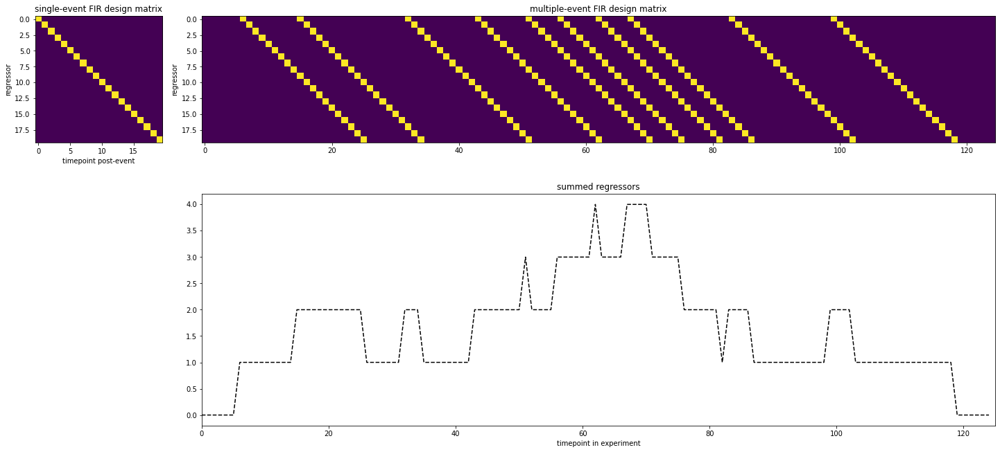

In [ ]:
# we'll assume, for now, that we're interested in 20 timepoints after the events
n_timepoints = 20
dm_one_event = np.eye(n_timepoints)

# we simulate some random event times, synced to the TR (important!): 
event_TRs = np.round(np.cumsum(3+np.random.exponential(scale=6, size=10))).astype(int)
total_dm = np.zeros((event_TRs[-1]+n_timepoints+event_TRs[0], n_timepoints))
for etr in event_TRs:
    total_dm[etr:etr+n_timepoints,:] += dm_one_event

dm_one_event = dm_one_event.astype(int) 
print(dm_one_event)         #Design matrix after converting the array to int data type

# and some plotting code
plt.figure(figsize=(20,10))
ax1 = plt.subplot2grid((2, 6), (0, 0), colspan=1)
ax2 = plt.subplot2grid((2, 6), (0, 1), colspan=5)
ax3 = plt.subplot2grid((2, 6), (1, 1), colspan=5)

ax1.imshow(dm_one_event, aspect=1)
ax1.set_title('single-event FIR design matrix')
ax1.set_xlabel('timepoint post-event')
ax1.set_ylabel('regressor')
ax2.imshow(total_dm.T)
ax2.set_title('multiple-event FIR design matrix')
ax2.set_ylabel('regressor')
ax3.plot(total_dm.sum(1), 'k--')
ax3.set_title('summed regressors')
ax3.set_xlabel('timepoint in experiment')
ax3.set_xlim([0,event_TRs[-1]+n_timepoints+event_TRs[0]])
plt.tight_layout()

How does this design matrix allow us to capture stacked responses? Well, if BOLD responses are likely to be stacked together in the experiment - that is, due to events occurring close together, these regressors will all be trying to explain the same timepoints of data. This means that in the least-squares solution that the GLM obtains the signal variance will be distributed between the different regressors which stand for different post-event timepoints. If this still feels weird, please re-consult the explanation linked to above. 

For now, we'll continue with our actual signal time-courses and event times. 

In [ ]:
!ls /content/data/hrf_mapper_59k/

# we'll load all the different event times we have, but will focus on the stimulus presentations for now.
blink_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_blink-times.tsv'), delimiter='\t')
sacc_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_sacc-times.tsv'), delimiter='\t')
stim_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_stim-times.tsv'), delimiter='\t')

# and, for convenience, we'll also read in the confounds for later use here. 
# for example, the bold_confounds dataframe contains slow drift regressors...
# these are called CosineXXX.
import pandas as pd
bold_confounds = pd.read_csv(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_bold_confounds.tsv'), delimiter='\t')
bold_confounds.head()

sub-012_ses-2_task-hrfmapper_run-1_blink-times.tsv
sub-012_ses-2_task-hrfmapper_run-1_bold_confounds.tsv
sub-012_ses-2_task-hrfmapper_run-1_bold_space-T1w_preproc_59k.L.dtseries.gii
sub-012_ses-2_task-hrfmapper_run-1_bold_space-T1w_preproc_59k.R.dtseries.gii
sub-012_ses-2_task-hrfmapper_run-1_sacc-times.tsv
sub-012_ses-2_task-hrfmapper_run-1_stim-times.tsv


,CSF,WhiteMatter,GlobalSignal,stdDVARS,non-stdDVARS,vx-wisestdDVARS,FramewiseDisplacement,tCompCor00,tCompCor01,tCompCor02,...,Cosine01,Cosine02,Cosine03,Cosine04,X,Y,Z,RotX,RotY,RotZ
0,-0.599468,0.128772,-0.049659,NaN,NaN,NaN,NaN,-0.046458,-0.035533,0.058893,...,0.067418,0.067416,0.067413,0.067409,0.031396,-0.043988,4.173760e-07,0.000000,0.000042,0.000143
1,-0.520622,0.173118,0.027116,1.158334,44.830067,0.975279,0.063663,-0.065542,0.011252,0.086448,...,0.067405,0.067385,0.067358,0.067323,0.035224,0.001082,-1.129900e-05,-0.000052,-0.000085,0.000259
2,-0.209736,0.218510,0.114279,1.180326,45.681202,0.983536,0.044131,-0.007144,0.062104,0.074606,...,0.067377,0.067323,0.067248,0.067152,0.032238,0.015444,6.457430e-03,-0.000252,-0.000213,0.000181
3,0.212731,0.247063,0.238158,1.174073,45.439209,1.014269,0.067836,0.046916,0.044904,0.010084,...,0.067336,0.067231,0.067083,0.066894,0.040596,-0.012869,3.279070e-06,0.000000,-0.000010,0.000220
4,0.453701,0.232361,0.294681,1.180041,45.670193,0.988277,0.038272,0.067986,-0.009028,-0.054827,...,0.067281,0.067107,0.066864,0.066552,0.037585,-0.045008,1.170110e-05,0.000000,0.000031,0.000199


[ 19.843  25.508  34.967  38.742  43.468  49.136  58.593  63.318  71.819
  81.269  85.053  94.503 100.171 104.895 109.621 113.404 119.071 123.796
 133.247 137.03  140.805 145.531 150.256 162.541 167.273 171.048 176.724
 180.499 184.282 188.058 193.733 202.234 207.909 211.684 215.467 219.251
 223.026 231.535 236.26  240.985 245.71  249.486 257.996 270.278 281.62
 286.346 290.129 293.904 297.688 301.463 307.138 311.864 323.206 331.706
 337.381 343.048 347.773 351.558 356.282 364.783 376.125 379.908 388.409]


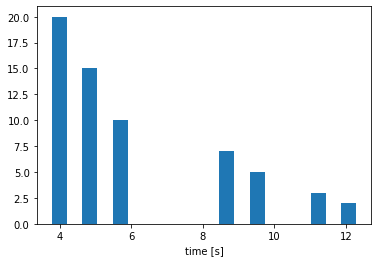

In [ ]:
# when were these events?
print(stim_times)
plt.hist(np.diff(stim_times), bins=20);
plt.xlabel('time [s]');

In [ ]:
# From the output above, you see that the events didn't occur at TR intervals. 
# we'll work with that in a bit. For now, we'll pretend that they did, and 
# round them off to the nearest TR (0.945s in this experiment)
tr = 0.945
event_TRs = np.round(stim_times/tr).astype(int)

# make sure no responses we try to fit run over the duration of our data
# this happens for the saccade times
event_TRs = event_TRs[event_TRs < (tseries_raw.shape[1] - n_timepoints)]
print(event_TRs) 

[ 21  27  37  41  46  52  62  67  76  86  90 100 106 111 116 120 126 131
 141 145 149 154 159 172 177 181 187 191 195 199 205 214 220 224 228 232
 236 245 250 255 260 264 273 286 298 303 307 311 315 319 325 330 342 351
 357 363 368 372 377 386 398 402 411]


In [ ]:
# But hey, now we're almost in the same place as with our simulated events! 
# This means we can create the design matrix immediately by code we already used!
total_dm = np.zeros((tseries_raw.shape[1], n_timepoints)).astype(int)  # design matrix = np.zeros(440,20)
for etr in event_TRs:
    total_dm[etr:etr+n_timepoints,:] += dm_one_event
print(total_dm)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


<Figure size 1440x720 with 0 Axes>

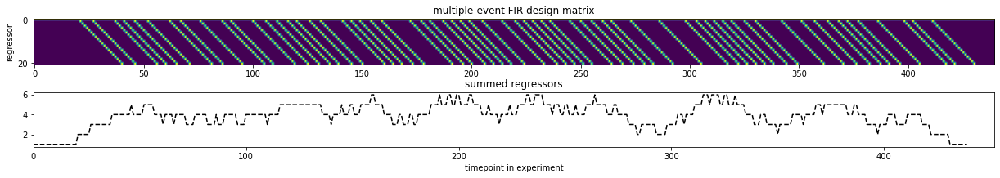

<Figure size 1440x720 with 0 Axes>

In [ ]:
# Then, if we were to just add an intercept and disregard our preprocessing, we 
# could start performing the GLM!

glm_dm = np.hstack((np.ones((1,tseries_raw.shape[1])).T, total_dm))

plt.figure(figsize=(20,3))
ax1 = plt.subplot2grid((2, 6), (0, 1), colspan=5)
ax2 = plt.subplot2grid((2, 6), (1, 1), colspan=5)
ax1.imshow(glm_dm.T)
ax1.set_title('multiple-event FIR design matrix')
ax1.set_ylabel('regressor')
#plt.plot(glm_dm)
ax2.plot(glm_dm.sum(1), 'k--')
ax2.set_title('summed regressors')
ax2.set_xlabel('timepoint in experiment')
ax2.set_xlim([0,event_TRs[-1]+n_timepoints+event_TRs[0]])
plt.tight_layout()

plt.figure(figsize=(20,10))



## Fitting the FIR model

Remember when we told you that the GLM is the basis for most of the analyses we do on fMRI data? This here is yet another example. Having built the design matrix, we can now perform a very simple GLM analysis, and we'll have our estimates of the BOLD response HRF shapes!

In [ ]:
# psc calculations can cause division by zero
tseries_psc = np.nan_to_num(psc(tseries_raw))
print(tseries_psc)
tseries_psc.shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in true_divide
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]


[[ 2.277279    1.1847258   2.0429373  ... -2.42455    -2.5897741
  -1.7537832 ]
 [ 1.1657119   1.9288659   0.84712505 ... -1.1611342  -0.17044544
  -1.1800349 ]
 [ 1.0751605   1.4383554   1.7893553  ... -1.4500082  -1.7353892
  -0.45993924]
 ...
 [ 8.473051   -0.54413676 -0.3963828  ...  6.2869787  -2.1351159
   2.0601869 ]
 [-2.823466   -3.4920573  -0.31285882 ...  1.7717242   5.392456
   4.699862  ]
 [-1.9164503   0.24797916  3.2691479  ...  0.6257057   3.5496712
   2.805674  ]]


(118584, 440)

In [ ]:
betas, residuals, rank,singular_values = np.linalg.lstsq(glm_dm, tseries_psc.T)
betas.shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  """Entry point for launching an IPython kernel.


(21, 118584)

In [ ]:
glm_dm.shape

(440, 21)

In [ ]:
yhat = np.dot(betas.T, glm_dm.T)
rsq = 1-(yhat-tseries_psc).var(1)/tseries_psc.var(1)
rsq.shape

/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:212: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


(118584,)

Failed to get connection
** (inkscape:3365): CRITICAL **: 11:12:41.046: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3365): CRITICAL **: 11:12:41.046: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3365): CRITICAL **: 11:12:41.047: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


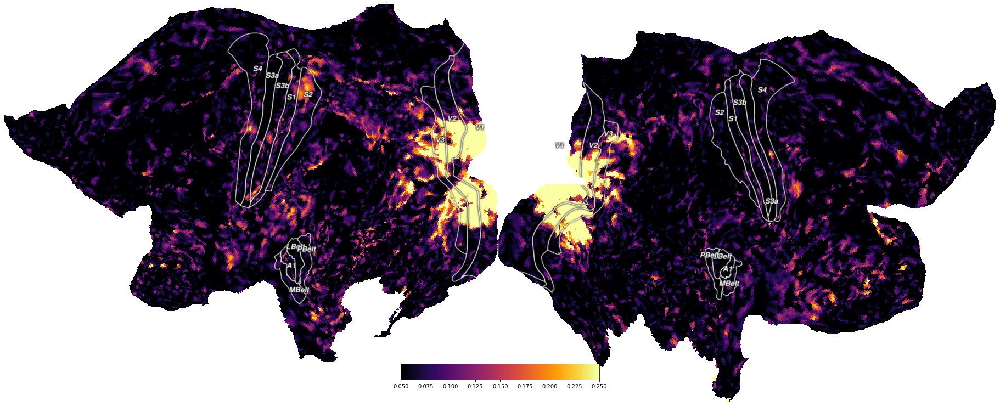

In [ ]:
# the rsq measure tells us where the voxels are whose signal is explained 
# using the FIR model. Not suprisingly, a simple visual stimulus causes
# BOLD responses mainly in low-level visual cortex.

cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='inferno', vmin=0.05, vmax=0.25));

Failed to get connection
** (inkscape:3370): CRITICAL **: 11:12:45.178: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3370): CRITICAL **: 11:12:45.178: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3370): CRITICAL **: 11:12:45.178: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


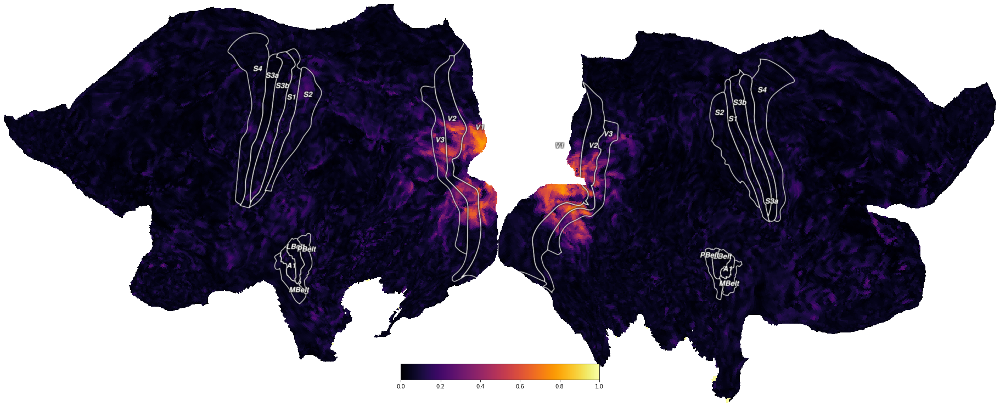

In [ ]:
cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='inferno', vmin=0., vmax=1.));

In [ ]:
# we could use this cell to plot all time-points as flatmaps.
# This allows you to see the BOLD response unfold on the surface of the cortex
# Plotting this many flatmaps is going to take a while, so use with caution.

f, sps = plt.subplots(n_timepoints, 1, figsize=(15,150))

for i, beta in enumerate(betas[1:]): # intercept is not so interesting :)
    cx.quickshow(cx.Vertex(beta*rsq, subject='hcp_999999', cmap='seismic', vmin=-3, vmax=3), fig=sps[i]);

Output hidden; open in https://colab.research.google.com to view.

2404 responsive voxels detected in V1 using threshold 0.05


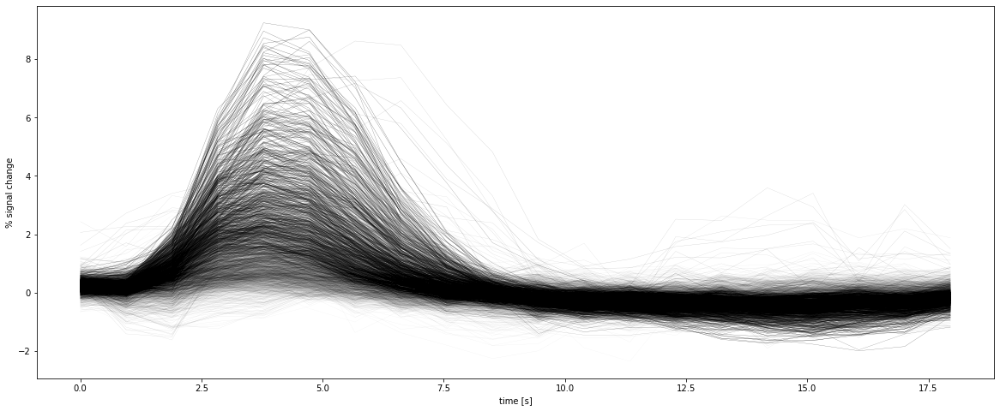

In [ ]:
rsq_threshold = 0.05
rsq_mask = rsq > rsq_threshold
V1_mask = atlas_data_both_hemis == 1

responsive_V1_vertex_rsq = rsq[rsq_mask & V1_mask]
responsive_V1_vertex_FIR_timecourses = betas[1:,rsq_mask & V1_mask]
# how many?
print(f'{responsive_V1_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V1 using threshold {rsq_threshold}')

plt.figure(figsize=(20,8))
for i, tc in enumerate(responsive_V1_vertex_FIR_timecourses.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='k', lw=0.25, alpha=responsive_V1_vertex_rsq[i]);
plt.xlabel('time [s]')
plt.ylabel('% signal change');

In [ ]:
from numpy.linalg import lstsq

## **Question1**

original stim times:
[ 19.843  25.508  34.967  38.742  43.468  49.136  58.593  63.318  71.819
  81.269  85.053  94.503 100.171 104.895 109.621 113.404 119.071 123.796
 133.247 137.03  140.805 145.531 150.256 162.541 167.273 171.048 176.724
 180.499 184.282 188.058 193.733 202.234 207.909 211.684 215.467 219.251
 223.026 231.535 236.26  240.985 245.71  249.486 257.996 270.278 281.62
 286.346 290.129 293.904 297.688 301.463 307.138 311.864 323.206 331.706
 337.381 343.048 347.773 351.558 356.282 364.783 376.125 379.908 388.409] 

Event TRs:
[ 21  27  37  41  46  52  62  67  76  86  90 100 106 111 116 120 126 131
 141 145 149 154 159 172 177 181 187 191 195 199 205 214 220 224 228 232
 236 245 250 255 260 264 273 286 298 303 307 311 315 319 325 330 342 351
 357 363 368 372 377 386 398 402 411] 

Event TRs (after duration time correction):
[ 21  27  37  41  46  52  62  67  76  86  90 100 106 111 116 120 126 131
 141 145 149 154 159 172 177 181 187 191 195 199 205 214 220 224 228 232
 236 2

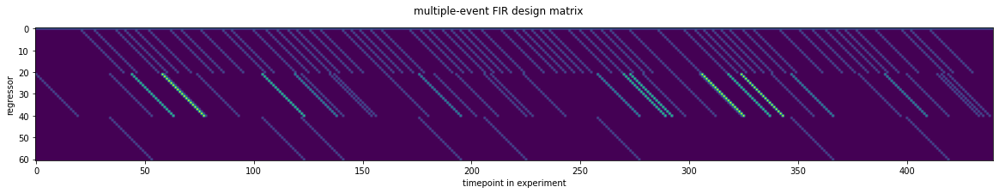

In [ ]:
######

'''  Pick the best-fitting voxel for each 
 of V1, V2, and V3, and plot its time-course for all three types of event: stimulus, blink, and saccade. 
 Also plot the average response-time-course in V1, V2, and V3. BONUS: add the 95% confidence interval 
 across voxels in each region as a shaded region to these latter plots. '''

#######

"What happens when you add these to the design matrix as separate time-courses to be estimated?"

#NOTE: ONLY THE OUTPUTS OF THE STIMS HAVE BEEN PRINTED! 
#OTHERWISE IT'LL BE TOO MUCH INFO. JUST FOR CLARIFICATION PURPOSES


# From the output above, you see that the events didn't occur at TR intervals. 
# we'll work with that in a bit. For now, we'll pretend that they did, and 
# round them off to the nearest TR (0.945s in this experiment)
tr = 0.945
event_TRs = np.round(stim_times/tr).astype(int)
event_TRs2 = np.round(sacc_times/tr).astype(int)
event_TRs3 = np.round(blink_times/tr).astype(int)
print("original stim times:")
print(stim_times, '\n')

print("Event TRs:")
print(event_TRs, '\n')

# make sure no responses we try to fit run over the duration of our data
# this happens for the saccade times
event_TRs = event_TRs[event_TRs < (tseries_raw.shape[1] - n_timepoints)]
event_TRs2 = event_TRs2[event_TRs2 < (tseries_raw.shape[1] - n_timepoints)]
event_TRs3 = event_TRs3[event_TRs3 < (tseries_raw.shape[1] - n_timepoints)]

print("Event TRs (after duration time correction):")
print(event_TRs, '\n')

# But hey, now we're almost in the same place as with our simulated events! 
# This means we can create the design matrix immediately by code we already used!
total_dm = np.zeros((tseries_raw.shape[1], n_timepoints))
total_dm2 = np.zeros((tseries_raw.shape[1], n_timepoints))
total_dm3 = np.zeros((tseries_raw.shape[1], n_timepoints))

for etr in event_TRs:
    total_dm[etr:etr+n_timepoints,:] += dm_one_event
for etr in event_TRs2:
    total_dm2[etr:etr+n_timepoints,:] += dm_one_event
for etr in event_TRs3:
    total_dm3[etr:etr+n_timepoints,:] += dm_one_event
#print(total_dm)


# Then, if we were to just add an intercept and disregard our preprocessing, we 
# could start performing the GLM!

glm_dm = np.hstack((np.ones((1,tseries_raw.shape[1])).T, total_dm, total_dm2, total_dm3))
print("The shape of the design matrix is is:",  glm_dm.shape, '\n')

print("The entire glm_dm:")
print(glm_dm, '\n')

plt.figure(figsize=(20,3))
plt.imshow(glm_dm.T)
plt.suptitle('multiple-event FIR design matrix')
plt.ylabel('regressor')
plt.xlabel('timepoint in experiment');

(2939, 61)
[[-0.76581443  0.22742837  0.22265481 ... -0.40335269 -0.73258316
   0.26556088]
 [-0.87346325  0.27383751  0.24286408 ... -0.28443371 -1.03510471
   0.22643711]
 [-0.97845253  0.33806116  0.23712365 ... -0.34957652 -0.92499049
   0.26120185]
 ...
 [ 0.43395609 -0.15599682  0.03585944 ... -0.44797156  0.61378657
  -0.27345304]
 [ 0.12656801 -0.01749997  0.0964624  ... -0.44293881  0.25203775
   0.28864951]
 [-0.03816243  0.03225856  0.15231911 ... -0.03401212 -0.00678852
   0.57561753]] 

(61, 1)
[[ 0.11611141]
 [ 0.03551178]
 [ 0.36679713]
 [ 1.06072385]
 [ 1.37300775]
 [ 1.29154653]
 [ 0.85625166]
 [ 0.42203436]
 [ 0.07092756]
 [-0.11331398]
 [-0.25480548]
 [-0.27776884]
 [-0.29300808]
 [-0.27760611]
 [-0.25963173]
 [-0.28810783]
 [-0.28322394]
 [-0.22727644]
 [-0.21171641]
 [-0.07480844]] 

(array([-5.65870779e-01,  1.06354781e-01,  2.31532706e-02,  3.45492277e-01,
        1.01999760e+00,  1.31907448e+00,  1.23975543e+00,  8.15692533e-01,
        3.95491593e-01,  5.207625

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  # Remove the CWD from sys.path while we load stuff.


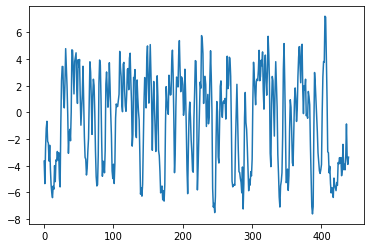

In [ ]:
import scipy.stats as st

'''Pick the best-fitting voxel for each of V1, V2, and V3, and plot its 
time-course for all three types of event: stimulus, blink, and saccade.'''
V1_mask = atlas_data_both_hemis == 1 # here '1' resembles V1 according to the Atlas above
responsive_V1_vertex = tseries_raw[V1_mask]

tseries_psc = np.nan_to_num(psc(responsive_V1_vertex))

betas, _, _, _ = np.linalg.lstsq(glm_dm, tseries_psc.T)
print(betas.T.shape)
print(betas.T,'\n')


average_betas = np.mean(betas.T, axis=0)[np.newaxis].T # 61 beta values, so shape (61,1)
print(average_betas.shape)
print(average_betas[1:21],'\n')


### NEEDED FOR PLOTTING CI: FORMULA
#https://www.geeksforgeeks.org/how-to-calculate-confidence-intervals-in-python/
all_CI = st.norm.interval(alpha=0.95,
                 loc=np.mean(betas.T,axis=0),
                 scale=st.sem(betas.T,axis=0))
print(all_CI, '\n')
low_ci = all_CI[0]
high_ci = all_CI[1]

lower_ci_stim = low_ci[1:21] 
print(lower_ci_stim)
upper_ci_stim = high_ci[1:21]
print(upper_ci_stim, '\n')

lower_ci_sacc = low_ci[21:41] 
upper_ci_sacc = high_ci[21:41]

lower_ci_blink = low_ci[41:61] 
upper_ci_blink = high_ci[41:61]



'''
### NEEDED FOR PLOTTING CI: MANUALLY
#####
margin_of_error_betas = st.sem(betas.T, axis=0)[np.newaxis].T * 1.96 #z-score for 95% CI
#print(margin_of_error_betas)
margin_of_error_betas_stim = margin_of_error_betas[1:21]
margin_of_error_betas_sacc = margin_of_error_betas[21:41]
margin_of_error_betas_blink = margin_of_error_betas[41:61]

# Margin of ERROR stim: CI
#print(margin_of_error_betas_stim)
#print(average_betas[1:21])
lower_ci_stim = average_betas[1:21] - margin_of_error_betas_stim
lower_ci_stim = lower_ci_stim.flatten()
print(lower_ci_stim)
upper_ci_stim = average_betas[1:21] + margin_of_error_betas_stim
upper_ci_stim = upper_ci_stim.flatten()
print(upper_ci_stim)
#print(upper_ci_stim.shape)
#print(lower_ci_stim)

# Margin of ERROR sacc: CI
lower_ci_sacc = average_betas[21:41] - margin_of_error_betas_sacc
lower_ci_sacc = lower_ci_sacc.flatten()
upper_ci_sacc = average_betas[21:41] + margin_of_error_betas_sacc
upper_ci_sacc = upper_ci_sacc.flatten()

# Margin of ERROR blink: CI
lower_ci_blink = average_betas[41:61] - margin_of_error_betas_blink
lower_ci_blink = lower_ci_blink.flatten()
upper_ci_blink = average_betas[41:61] + margin_of_error_betas_blink
upper_ci_blink = upper_ci_blink.flatten()
'''





yhat = np.dot(betas.T, glm_dm.T)
rsq = 1-(yhat-tseries_psc).var(1)/tseries_psc.var(1)





#Self implemented
#Pick the best fitting voxel (with highest R-sqaured value) and return its index
maximum_V1 = np.nanmax(rsq)
print("R-squared value of best fitting voxel is: %f" % np.nanmax(rsq), '\n')
index_of_maximum_V1 = np.where(rsq == maximum_V1)[0][0]
print("index value of best fitting voxel is: %d" % index_of_maximum_V1, '\n')

plt.plot(tseries_psc[index_of_maximum_V1])

Text(0.5, 1.0, 'V1')

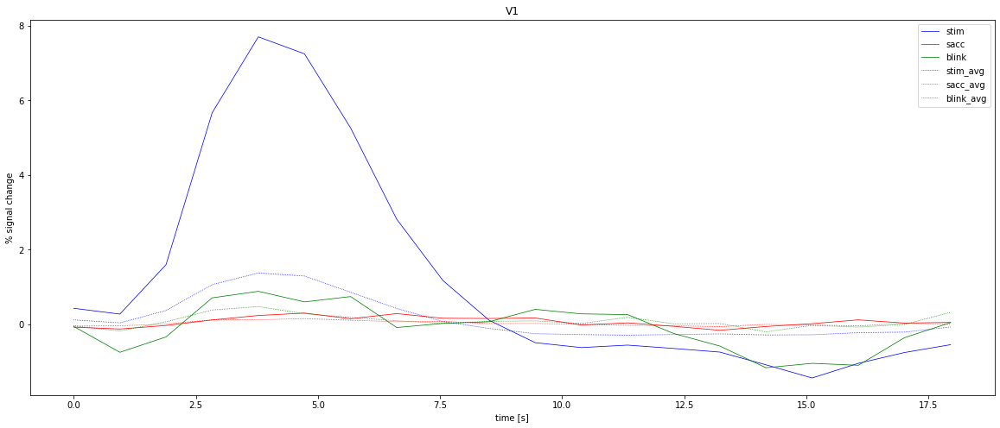

In [ ]:


#rsq_threshold = 0.05
#rsq_mask = rsq > rsq_threshold
#V1_mask = atlas_data_both_hemis == 1


#responsive_V1_vertex_rsq = rsq[rsq_mask & V1_mask]
responsive_V1_vertex_FIR_timecourses_stim = betas[1:21,[index_of_maximum_V1]]
responsive_V1_vertex_FIR_timecourses_sacc = betas[21:41,[index_of_maximum_V1]]
responsive_V1_vertex_FIR_timecourses_blink = betas[41:61,[index_of_maximum_V1]]
# how many?
#print(f'{responsive_V1_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V1 using threshold {rsq_threshold}')


#average_time_courses
avg_v1_timecourse_stim = average_betas[1:21]
avg_v1_timecourse_sacc = average_betas[21:41]
avg_v1_timecourse_blink = average_betas[41:61]






plt.figure(figsize=(20,8))
for i, tc in enumerate(responsive_V1_vertex_FIR_timecourses_stim.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, c='b', lw=0.75, label='stim');
for i, tc in enumerate(responsive_V1_vertex_FIR_timecourses_sacc.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='r', lw=0.75, label='sacc');
for i, tc in enumerate(responsive_V1_vertex_FIR_timecourses_blink.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='g', lw=0.75, label='blink');


#the average ones
for i, tc in enumerate(avg_v1_timecourse_stim.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='b', lw=0.75, label='stim_avg');

for i, tc in enumerate(avg_v1_timecourse_sacc.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='r', lw=0.75, label='sacc_avg');

for i, tc in enumerate(avg_v1_timecourse_blink.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='g', lw=0.75, label='blink_avg');

plt.xlabel('time [s]')
plt.ylabel('% signal change');
plt.legend()
plt.title("V1")

Text(0.5, 1.0, 'Average signal change V1, including shaded Confidence Intervals')

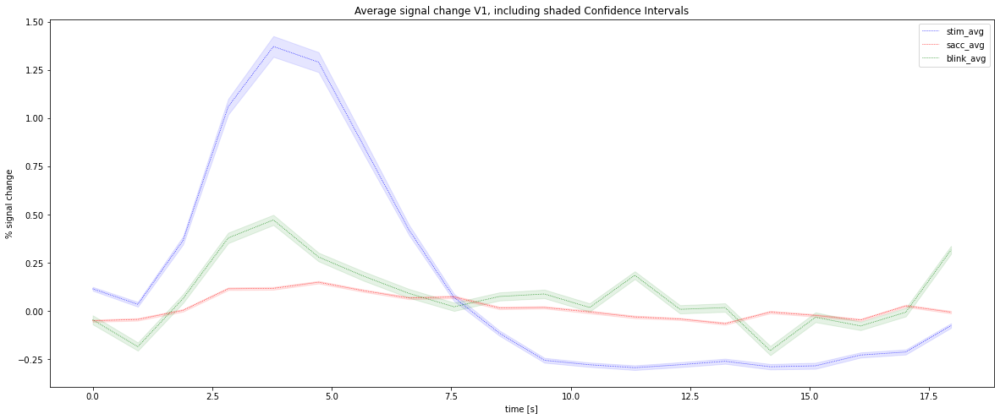

In [ ]:
plt.figure(figsize=(20,8))
for i, tc in enumerate(avg_v1_timecourse_stim.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='b', lw=0.75, label='stim_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_stim, upper_ci_stim, color='blue', alpha=0.1)

for i, tc in enumerate(avg_v1_timecourse_sacc.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='r', lw=0.75, label='sacc_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_sacc, upper_ci_sacc, color='r', alpha=0.1)

for i, tc in enumerate(avg_v1_timecourse_blink.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='g', lw=0.75, label='blink_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_blink, upper_ci_blink, color='g', alpha=0.1)

plt.xlabel('time [s]')
plt.ylabel('% signal change');
plt.legend()
plt.title("Average signal change V1, including shaded Confidence Intervals")

(61, 1)
R-squared value of best fitting voxel is: 0.762965 

index value of best fitting voxel is: 1426 



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  if __name__ == '__main__':


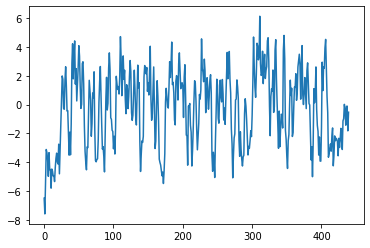

In [ ]:
'''Pick the best-fitting voxel for each of V1, V2, and V3, and plot its 
time-course for all three types of event: stimulus, blink, and saccade.'''
V2_mask = atlas_data_both_hemis == 4 # here '4' resembles V2 according to the Atlas above
responsive_V2_vertex = tseries_raw[V2_mask]


tseries_psc = np.nan_to_num(psc(responsive_V2_vertex))

betas, _, _, _ = np.linalg.lstsq(glm_dm, tseries_psc.T)
#print(betas.T)


average_betas = np.mean(betas.T, axis=0)[np.newaxis].T # 61 beta values, so shape (61,1)
print(average_betas.shape)


### NEEDED FOR PLOTTING CI:

margin_of_error_betas = st.sem(betas.T, axis=0)[np.newaxis].T * 1.96 #z-score for 95% CI
#print(margin_of_error_betas)
margin_of_error_betas_stim = margin_of_error_betas[1:21]
margin_of_error_betas_sacc = margin_of_error_betas[21:41]
margin_of_error_betas_blink = margin_of_error_betas[41:61]

# Margin of ERROR stim: CI
#print(margin_of_error_betas_stim)
#print(average_betas[1:21])
lower_ci_stim = average_betas[1:21] - margin_of_error_betas_stim
lower_ci_stim = lower_ci_stim.flatten()
upper_ci_stim = average_betas[1:21] + margin_of_error_betas_stim
upper_ci_stim = upper_ci_stim.flatten()
#print(upper_ci_stim.shape)
#print(lower_ci_stim)

# Margin of ERROR sacc: CI
lower_ci_sacc = average_betas[21:41] - margin_of_error_betas_sacc
lower_ci_sacc = lower_ci_sacc.flatten()
upper_ci_sacc = average_betas[21:41] + margin_of_error_betas_sacc
upper_ci_sacc = upper_ci_sacc.flatten()

# Margin of ERROR blink: CI
lower_ci_blink = average_betas[41:61] - margin_of_error_betas_blink
lower_ci_blink = lower_ci_blink.flatten()
upper_ci_blink = average_betas[41:61] + margin_of_error_betas_blink
upper_ci_blink = upper_ci_blink.flatten()


yhat = np.dot(betas.T, glm_dm.T)
rsq = 1-(yhat-tseries_psc).var(1)/tseries_psc.var(1)


#self implemented
#Pick the best fitting voxel (with highest R-sqaured value) and return its index
maximum_V2 = np.nanmax(rsq)
print("R-squared value of best fitting voxel is: %f" % np.nanmax(rsq), '\n')
index_of_maximum_V2 = np.where(rsq == maximum_V2)[0][0]
print("index value of best fitting voxel is: %d" % index_of_maximum_V2, '\n')

plt.plot(tseries_psc[index_of_maximum_V2])

Text(0.5, 1.0, 'V2')

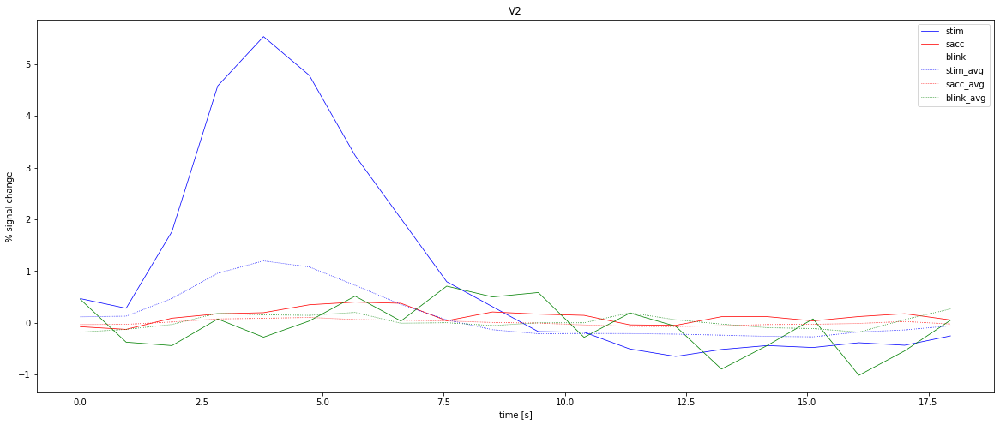

In [ ]:
responsive_V2_vertex_FIR_timecourses_stim = betas[1:21,[index_of_maximum_V2]]
responsive_V2_vertex_FIR_timecourses_sacc = betas[21:41,[index_of_maximum_V2]]
responsive_V2_vertex_FIR_timecourses_blink = betas[41:61,[index_of_maximum_V2]]

#average_time_courses
avg_v2_timecourse_stim = average_betas[1:21]
avg_v2_timecourse_sacc = average_betas[21:41]
avg_v2_timecourse_blink = average_betas[41:61]


plt.figure(figsize=(20,8))
for i, tc in enumerate(responsive_V2_vertex_FIR_timecourses_stim.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='b', lw=0.75, label='stim');
for i, tc in enumerate(responsive_V2_vertex_FIR_timecourses_sacc.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='r', lw=0.75, label='sacc');
for i, tc in enumerate(responsive_V2_vertex_FIR_timecourses_blink.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='g', lw=0.75, label='blink');


#the average ones
for i, tc in enumerate(avg_v2_timecourse_stim.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='b', lw=0.75, label='stim_avg');

for i, tc in enumerate(avg_v2_timecourse_sacc.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='r', lw=0.75, label='sacc_avg');

for i, tc in enumerate(avg_v2_timecourse_blink.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='g', lw=0.75, label='blink_avg');


plt.xlabel('time [s]')
plt.ylabel('% signal change');
plt.legend()
plt.title("V2")

Text(0.5, 1.0, 'Average signal change V2, including shaded Confidence Intervals')

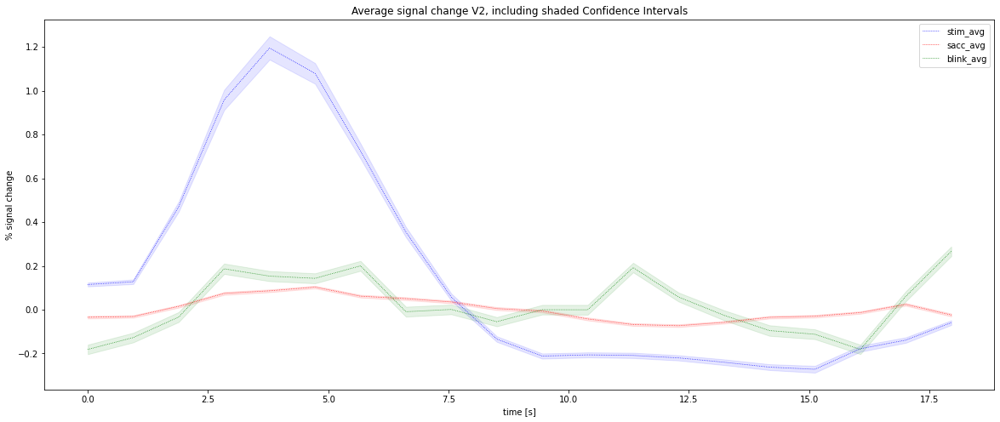

In [ ]:
plt.figure(figsize=(20,8))
for i, tc in enumerate(avg_v2_timecourse_stim.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='b', lw=0.75, label='stim_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_stim, upper_ci_stim, color='blue', alpha=0.1)

for i, tc in enumerate(avg_v2_timecourse_sacc.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='r', lw=0.75, label='sacc_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_sacc, upper_ci_sacc, color='r', alpha=0.1)

for i, tc in enumerate(avg_v2_timecourse_blink.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='g', lw=0.75, label='blink_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_blink, upper_ci_blink, color='g', alpha=0.1)

plt.xlabel('time [s]')
plt.ylabel('% signal change');
plt.legend()
plt.title("Average signal change V2, including shaded Confidence Intervals")

(61, 1)
R-squared value of best fitting voxel is: 0.739657 

index value of best fitting voxel is: 998 



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  if __name__ == '__main__':


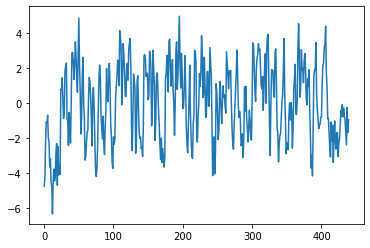

In [ ]:
'''Pick the best-fitting voxel for each of V1, V2, and V3, and plot its 
time-course for all three types of event: stimulus, blink, and saccade.'''
V3_mask = atlas_data_both_hemis == 5 # here '5' resembles V3 according to the Atlas above
responsive_V3_vertex = tseries_raw[V3_mask]


tseries_psc = np.nan_to_num(psc(responsive_V3_vertex))

betas, _, _, _ = np.linalg.lstsq(glm_dm, tseries_psc.T)
#print(betas.T)


average_betas = np.mean(betas.T, axis=0)[np.newaxis].T # 61 beta values, so shape (61,1)
print(average_betas.shape)


### NEEDED FOR PLOTTING CI:

margin_of_error_betas = st.sem(betas.T, axis=0)[np.newaxis].T * 1.96 #z-score for 95% CI
#print(margin_of_error_betas)
margin_of_error_betas_stim = margin_of_error_betas[1:21]
margin_of_error_betas_sacc = margin_of_error_betas[21:41]
margin_of_error_betas_blink = margin_of_error_betas[41:61]

# Margin of ERROR stim: CI
#print(margin_of_error_betas_stim)
#print(average_betas[1:21])
lower_ci_stim = average_betas[1:21] - margin_of_error_betas_stim
lower_ci_stim = lower_ci_stim.flatten()
upper_ci_stim = average_betas[1:21] + margin_of_error_betas_stim
upper_ci_stim = upper_ci_stim.flatten()
#print(upper_ci_stim.shape)
#print(lower_ci_stim)

# Margin of ERROR sacc: CI
lower_ci_sacc = average_betas[21:41] - margin_of_error_betas_sacc
lower_ci_sacc = lower_ci_sacc.flatten()
upper_ci_sacc = average_betas[21:41] + margin_of_error_betas_sacc
upper_ci_sacc = upper_ci_sacc.flatten()

# Margin of ERROR blink: CI
lower_ci_blink = average_betas[41:61] - margin_of_error_betas_blink
lower_ci_blink = lower_ci_blink.flatten()
upper_ci_blink = average_betas[41:61] + margin_of_error_betas_blink
upper_ci_blink = upper_ci_blink.flatten()




yhat = np.dot(betas.T, glm_dm.T)
rsq = 1-(yhat-tseries_psc).var(1)/tseries_psc.var(1)


#self implemented
#Pick the best fitting voxel (with highest R-sqaured value) and return its index
maximum_V3 = np.nanmax(rsq)
print("R-squared value of best fitting voxel is: %f" % np.nanmax(rsq), '\n')
index_of_maximum_V3 = np.where(rsq == maximum_V3)[0][0]
print("index value of best fitting voxel is: %d" % index_of_maximum_V3, '\n')

plt.plot(tseries_psc[index_of_maximum_V3])

Text(0.5, 1.0, 'V3')

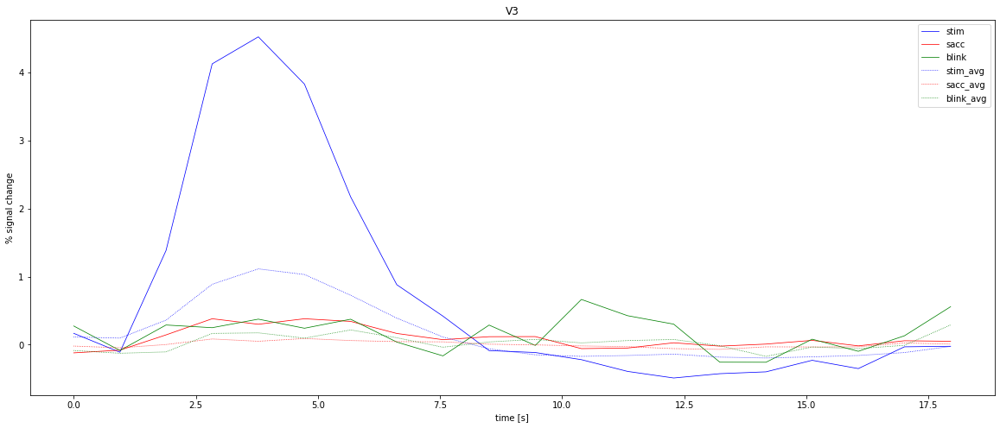

In [ ]:
responsive_V3_vertex_FIR_timecourses_stim = betas[1:21,[index_of_maximum_V3]]
responsive_V3_vertex_FIR_timecourses_sacc = betas[21:41,[index_of_maximum_V3]]
responsive_V3_vertex_FIR_timecourses_blink = betas[41:61,[index_of_maximum_V3]]

#average_time_courses
avg_v3_timecourse_stim = average_betas[1:21]
avg_v3_timecourse_sacc = average_betas[21:41]
avg_v3_timecourse_blink = average_betas[41:61]



plt.figure(figsize=(20,8))
for i, tc in enumerate(responsive_V3_vertex_FIR_timecourses_stim.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='b', lw=0.75, label='stim');
for i, tc in enumerate(responsive_V3_vertex_FIR_timecourses_sacc.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='r', lw=0.75, label='sacc');
for i, tc in enumerate(responsive_V3_vertex_FIR_timecourses_blink.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='g', lw=0.75, label='blink');

#the average ones
for i, tc in enumerate(avg_v3_timecourse_stim.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='b', lw=0.75, label='stim_avg');

for i, tc in enumerate(avg_v3_timecourse_sacc.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='r', lw=0.75, label='sacc_avg');

for i, tc in enumerate(avg_v3_timecourse_blink.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='g', lw=0.75, label='blink_avg');

plt.xlabel('time [s]')
plt.ylabel('% signal change');
plt.legend()
plt.title("V3")

Text(0.5, 1.0, 'Average signal change V3, including shaded Confidence Intervals')

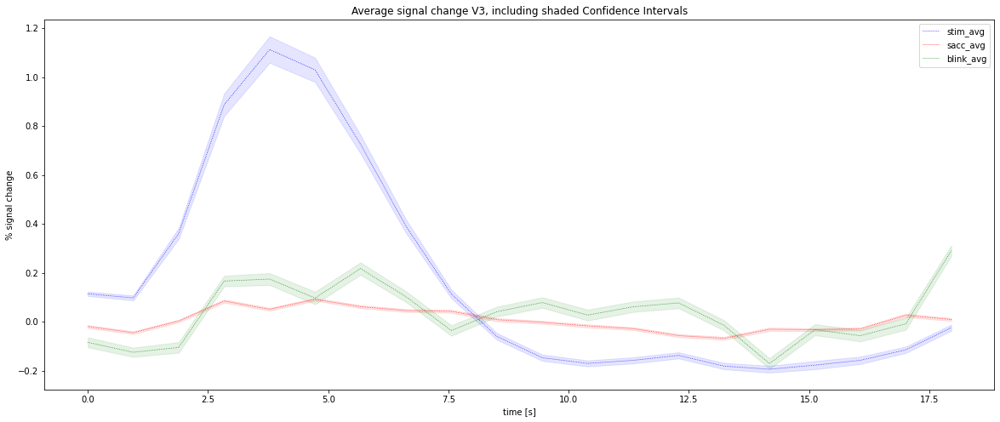

In [ ]:
plt.figure(figsize=(20,8))
for i, tc in enumerate(avg_v3_timecourse_stim.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='b', lw=0.75, label='stim_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_stim, upper_ci_stim, color='blue', alpha=0.1)

for i, tc in enumerate(avg_v3_timecourse_sacc.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='r', lw=0.75, label='sacc_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_sacc, upper_ci_sacc, color='r', alpha=0.1)

for i, tc in enumerate(avg_v3_timecourse_blink.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='g', lw=0.75, label='blink_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_blink, upper_ci_blink, color='g', alpha=0.1)

plt.xlabel('time [s]')
plt.ylabel('% signal change');
plt.legend()
plt.title("Average signal change V3, including shaded Confidence Intervals")

# Question 2

#### Plots including regressors

[[ 1.          0.          0.         ...  0.06741612  0.06741311
   0.06740925]
 [ 1.          0.          0.         ...  0.06738519  0.06735813
   0.06732334]
 [ 1.          0.          0.         ...  0.06732334  0.06724821
   0.06715165]
 ...
 [ 1.          0.          0.         ... -0.06732334  0.06724821
  -0.06715165]
 [ 1.          0.          0.         ... -0.06738519  0.06735813
  -0.06732334]
 [ 1.          0.          0.         ... -0.06741612  0.06741311
  -0.06740925]]
(440, 82)


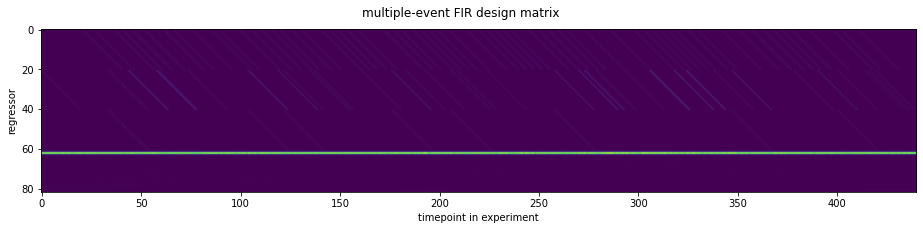

In [ ]:
# Preprocess: Create a proper DF of the confounds and add it to the glm_df

bold_confounds = pd.read_csv(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_bold_confounds.tsv'), delimiter='\t')

h = bold_confounds.CSF
h = np.expand_dims(h,axis=0)

df_nuissance_regressors = bold_confounds.drop(columns=['CSF', 'WhiteMatter','GlobalSignal','X','Y','Z','RotX','RotY','RotZ'])
#df_nuissance_regressors = df_nuissance_regressors.fillna(0) #change NAN to 0
df_nuissance_regressors = df_nuissance_regressors.fillna(df_nuissance_regressors.mean()) #change NAN to mean of regressor

glm_dmtest = np.hstack((glm_dm, df_nuissance_regressors))
print(glm_dmtest)
print(glm_dmtest.shape)

plt.figure(figsize=(20,3))
plt.imshow(glm_dmtest.T)
plt.suptitle('multiple-event FIR design matrix')
plt.ylabel('regressor')
plt.xlabel('timepoint in experiment');

(2939, 82) 

(2939,)
(82, 1)
R-squared value of best fitting voxel is: 0.903618 

index value of best fitting voxel is: 1676 



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  # Remove the CWD from sys.path while we load stuff.


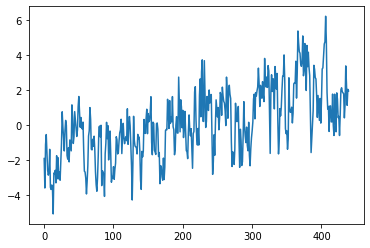

In [ ]:
import scipy.stats as st

'''Pick the best-fitting voxel for each of V1, V2, and V3, and plot its 
time-course for all three types of event: stimulus, blink, and saccade.'''
V1_mask = atlas_data_both_hemis == 1 # here '1' resembles V1 according to the Atlas above
responsive_V1_vertex = tseries_raw[V1_mask]

tseries_psc = np.nan_to_num(psc(responsive_V1_vertex))

betas, _, _, _ = np.linalg.lstsq(glm_dmtest, tseries_psc.T)
print(betas.T.shape, '\n')
print(betas[0].T.shape)


average_betas = np.mean(betas.T, axis=0)[np.newaxis].T # 61 beta values, so shape (61,1)
print(average_betas.shape)
#print(average_betas)

### NEEDED FOR PLOTTING CI:

margin_of_error_betas = st.sem(betas.T, axis=0)[np.newaxis].T * 1.96 #z-score for 95% CI
#print(margin_of_error_betas)
margin_of_error_betas_stim = margin_of_error_betas[1:21]
margin_of_error_betas_sacc = margin_of_error_betas[21:41]
margin_of_error_betas_blink = margin_of_error_betas[41:61]

# Margin of ERROR stim: CI
#print(margin_of_error_betas_stim)
#print(average_betas[1:21])
lower_ci_stim = average_betas[1:21] - margin_of_error_betas_stim
lower_ci_stim = lower_ci_stim.flatten()
upper_ci_stim = average_betas[1:21] + margin_of_error_betas_stim
upper_ci_stim = upper_ci_stim.flatten()
#print(upper_ci_stim.shape)
#print(lower_ci_stim)

# Margin of ERROR sacc: CI
lower_ci_sacc = average_betas[21:41] - margin_of_error_betas_sacc
lower_ci_sacc = lower_ci_sacc.flatten()
upper_ci_sacc = average_betas[21:41] + margin_of_error_betas_sacc
upper_ci_sacc = upper_ci_sacc.flatten()

# Margin of ERROR blink: CI
lower_ci_blink = average_betas[41:61] - margin_of_error_betas_blink
lower_ci_blink = lower_ci_blink.flatten()
upper_ci_blink = average_betas[41:61] + margin_of_error_betas_blink
upper_ci_blink = upper_ci_blink.flatten()






yhat = np.dot(betas.T, glm_dmtest.T)
rsq = 1-(yhat-tseries_psc).var(1)/tseries_psc.var(1)





#Self implemented
#Pick the best fitting voxel (with highest R-sqaured value) and return its index
maximum_V1 = np.nanmax(rsq)
print("R-squared value of best fitting voxel is: %f" % np.nanmax(rsq), '\n')
index_of_maximum_V1 = np.where(rsq == maximum_V1)[0][0]
print("index value of best fitting voxel is: %d" % index_of_maximum_V1, '\n')

plt.plot(tseries_psc[index_of_maximum_V1])

Text(0.5, 1.0, 'V1')

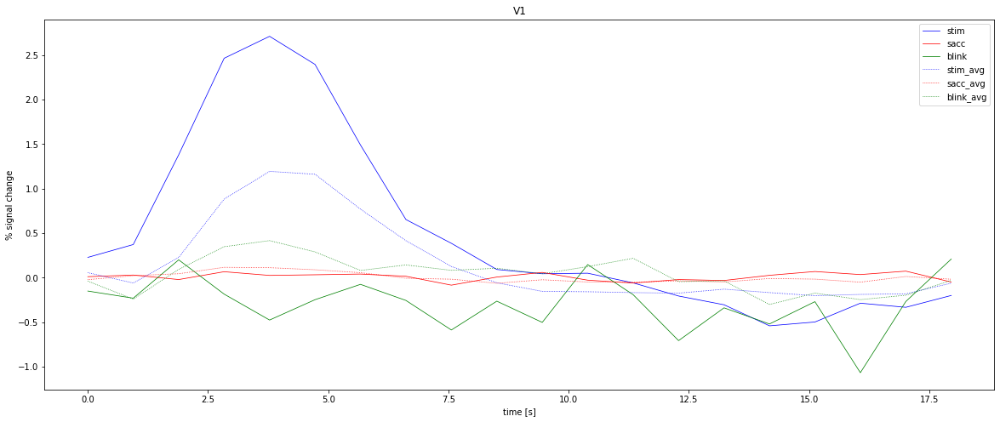

In [ ]:


#rsq_threshold = 0.05
#rsq_mask = rsq > rsq_threshold
#V1_mask = atlas_data_both_hemis == 1


#responsive_V1_vertex_rsq = rsq[rsq_mask & V1_mask]
responsive_V1_vertex_FIR_timecourses_stim = betas[1:21,[index_of_maximum_V1]]
responsive_V1_vertex_FIR_timecourses_sacc = betas[21:41,[index_of_maximum_V1]]
responsive_V1_vertex_FIR_timecourses_blink = betas[41:61,[index_of_maximum_V1]]
# how many?
#print(f'{responsive_V1_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V1 using threshold {rsq_threshold}')


#average_time_courses
avg_v1_timecourse_stim = average_betas[1:21]
avg_v1_timecourse_sacc = average_betas[21:41]
avg_v1_timecourse_blink = average_betas[41:61]


plt.figure(figsize=(20,8))
for i, tc in enumerate(responsive_V1_vertex_FIR_timecourses_stim.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, c='b', lw=0.75, label='stim');
for i, tc in enumerate(responsive_V1_vertex_FIR_timecourses_sacc.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='r', lw=0.75, label='sacc');
for i, tc in enumerate(responsive_V1_vertex_FIR_timecourses_blink.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='g', lw=0.75, label='blink');

#the average ones
for i, tc in enumerate(avg_v1_timecourse_stim.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='b', lw=0.75, label='stim_avg');

for i, tc in enumerate(avg_v1_timecourse_sacc.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='r', lw=0.75, label='sacc_avg');

for i, tc in enumerate(avg_v1_timecourse_blink.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='g', lw=0.75, label='blink_avg');

plt.xlabel('time [s]')
plt.ylabel('% signal change');
plt.legend()
plt.title("V1")

Text(0.5, 1.0, 'Average signal change V1, including shaded Confidence Intervals')

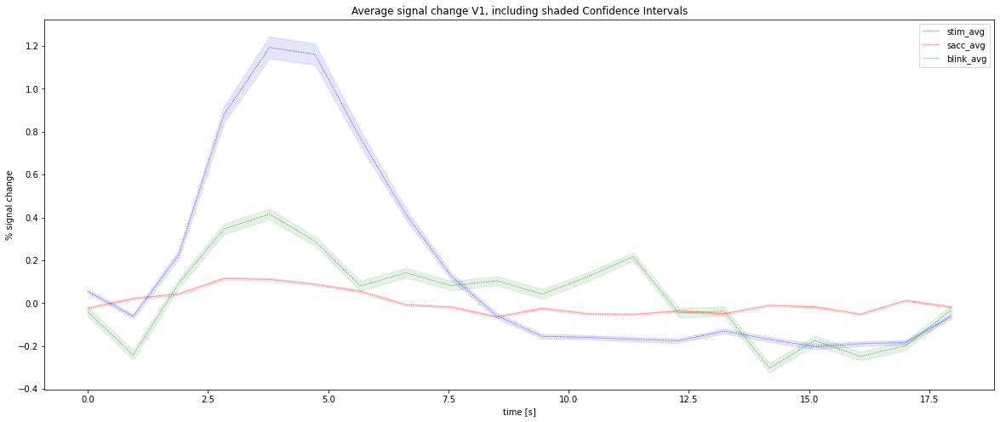

In [ ]:
plt.figure(figsize=(20,8))
for i, tc in enumerate(avg_v1_timecourse_stim.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='b', lw=0.75, label='stim_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_stim, upper_ci_stim, color='blue', alpha=0.1)

for i, tc in enumerate(avg_v1_timecourse_sacc.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='r', lw=0.75, label='sacc_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_sacc, upper_ci_sacc, color='r', alpha=0.1)

for i, tc in enumerate(avg_v1_timecourse_blink.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='g', lw=0.75, label='blink_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_blink, upper_ci_blink, color='g', alpha=0.1)

plt.xlabel('time [s]')
plt.ylabel('% signal change');
plt.legend()
plt.title("Average signal change V1, including shaded Confidence Intervals")

(82, 1)
R-squared value of best fitting voxel is: 0.875681 

index value of best fitting voxel is: 1357 



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  if __name__ == '__main__':


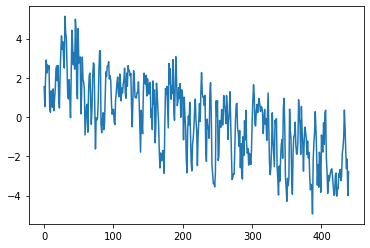

In [ ]:
'''Pick the best-fitting voxel for each of V1, V2, and V3, and plot its 
time-course for all three types of event: stimulus, blink, and saccade.'''
V2_mask = atlas_data_both_hemis == 4 # here '4' resembles V2 according to the Atlas above
responsive_V2_vertex = tseries_raw[V2_mask]


tseries_psc = np.nan_to_num(psc(responsive_V2_vertex))

betas, _, _, _ = np.linalg.lstsq(glm_dmtest, tseries_psc.T)
#print(betas.T)


average_betas = np.mean(betas.T, axis=0)[np.newaxis].T # 61 beta values, so shape (61,1)
print(average_betas.shape)


### NEEDED FOR PLOTTING CI:

margin_of_error_betas = st.sem(betas.T, axis=0)[np.newaxis].T * 1.96 #z-score for 95% CI
#print(margin_of_error_betas)
margin_of_error_betas_stim = margin_of_error_betas[1:21]
margin_of_error_betas_sacc = margin_of_error_betas[21:41]
margin_of_error_betas_blink = margin_of_error_betas[41:61]

# Margin of ERROR stim: CI
#print(margin_of_error_betas_stim)
#print(average_betas[1:21])
lower_ci_stim = average_betas[1:21] - margin_of_error_betas_stim
lower_ci_stim = lower_ci_stim.flatten()
upper_ci_stim = average_betas[1:21] + margin_of_error_betas_stim
upper_ci_stim = upper_ci_stim.flatten()
#print(upper_ci_stim.shape)
#print(lower_ci_stim)

# Margin of ERROR sacc: CI
lower_ci_sacc = average_betas[21:41] - margin_of_error_betas_sacc
lower_ci_sacc = lower_ci_sacc.flatten()
upper_ci_sacc = average_betas[21:41] + margin_of_error_betas_sacc
upper_ci_sacc = upper_ci_sacc.flatten()

# Margin of ERROR blink: CI
lower_ci_blink = average_betas[41:61] - margin_of_error_betas_blink
lower_ci_blink = lower_ci_blink.flatten()
upper_ci_blink = average_betas[41:61] + margin_of_error_betas_blink
upper_ci_blink = upper_ci_blink.flatten()


yhat = np.dot(betas.T, glm_dmtest.T)
rsq = 1-(yhat-tseries_psc).var(1)/tseries_psc.var(1)


#self implemented
#Pick the best fitting voxel (with highest R-sqaured value) and return its index
maximum_V2 = np.nanmax(rsq)
print("R-squared value of best fitting voxel is: %f" % np.nanmax(rsq), '\n')
index_of_maximum_V2 = np.where(rsq == maximum_V2)[0][0]
print("index value of best fitting voxel is: %d" % index_of_maximum_V2, '\n')

plt.plot(tseries_psc[index_of_maximum_V2])

Text(0.5, 1.0, 'V2')

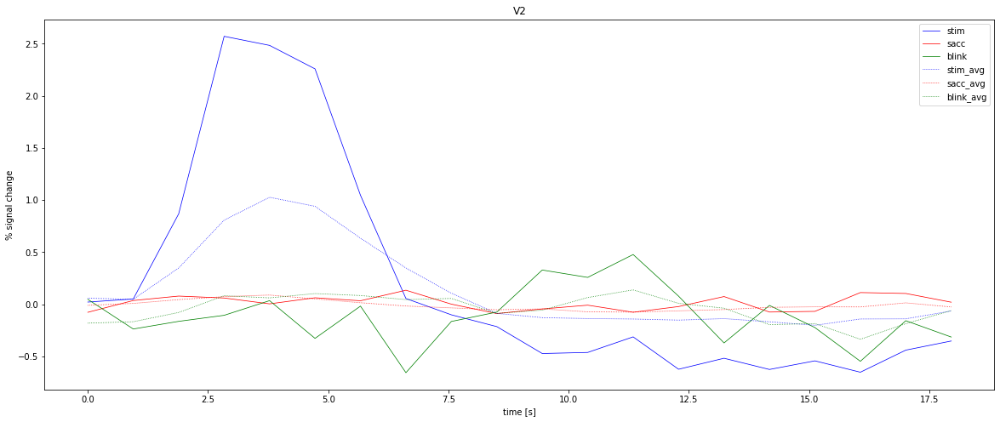

In [ ]:
responsive_V2_vertex_FIR_timecourses_stim = betas[1:21,[index_of_maximum_V2]]
responsive_V2_vertex_FIR_timecourses_sacc = betas[21:41,[index_of_maximum_V2]]
responsive_V2_vertex_FIR_timecourses_blink = betas[41:61,[index_of_maximum_V2]]

#average_time_courses
avg_v2_timecourse_stim = average_betas[1:21]
avg_v2_timecourse_sacc = average_betas[21:41]
avg_v2_timecourse_blink = average_betas[41:61]


plt.figure(figsize=(20,8))
for i, tc in enumerate(responsive_V2_vertex_FIR_timecourses_stim.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='b', lw=0.75, label='stim');
for i, tc in enumerate(responsive_V2_vertex_FIR_timecourses_sacc.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='r', lw=0.75, label='sacc');
for i, tc in enumerate(responsive_V2_vertex_FIR_timecourses_blink.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='g', lw=0.75, label='blink');


#the average ones
for i, tc in enumerate(avg_v2_timecourse_stim.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='b', lw=0.75, label='stim_avg');

for i, tc in enumerate(avg_v2_timecourse_sacc.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='r', lw=0.75, label='sacc_avg');

for i, tc in enumerate(avg_v2_timecourse_blink.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='g', lw=0.75, label='blink_avg');


plt.xlabel('time [s]')
plt.ylabel('% signal change');
plt.legend()
plt.title("V2")

Text(0.5, 1.0, 'Average signal change V2, including shaded Confidence Intervals')

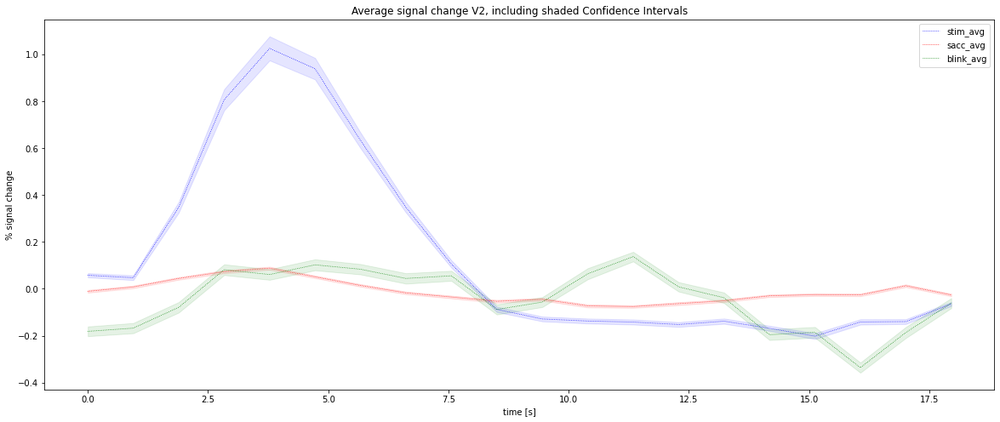

In [ ]:
plt.figure(figsize=(20,8))
for i, tc in enumerate(avg_v2_timecourse_stim.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='b', lw=0.75, label='stim_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_stim, upper_ci_stim, color='blue', alpha=0.1)

for i, tc in enumerate(avg_v2_timecourse_sacc.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='r', lw=0.75, label='sacc_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_sacc, upper_ci_sacc, color='r', alpha=0.1)

for i, tc in enumerate(avg_v2_timecourse_blink.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='g', lw=0.75, label='blink_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_blink, upper_ci_blink, color='g', alpha=0.1)

plt.xlabel('time [s]')
plt.ylabel('% signal change');
plt.legend()
plt.title("Average signal change V2, including shaded Confidence Intervals")

(82, 1)
R-squared value of best fitting voxel is: 0.855669 

index value of best fitting voxel is: 989 



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  if __name__ == '__main__':


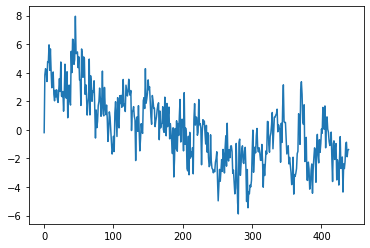

In [ ]:
'''Pick the best-fitting voxel for each of V1, V2, and V3, and plot its 
time-course for all three types of event: stimulus, blink, and saccade.'''
V3_mask = atlas_data_both_hemis == 5 # here '5' resembles V3 according to the Atlas above
responsive_V3_vertex = tseries_raw[V3_mask]


tseries_psc = np.nan_to_num(psc(responsive_V3_vertex))

betas, _, _, _ = np.linalg.lstsq(glm_dmtest, tseries_psc.T)
#print(betas.T)


average_betas = np.mean(betas.T, axis=0)[np.newaxis].T # 61 beta values, so shape (61,1)
print(average_betas.shape)


### NEEDED FOR PLOTTING CI:

margin_of_error_betas = st.sem(betas.T, axis=0)[np.newaxis].T * 1.96 #z-score for 95% CI
#print(margin_of_error_betas)
margin_of_error_betas_stim = margin_of_error_betas[1:21]
margin_of_error_betas_sacc = margin_of_error_betas[21:41]
margin_of_error_betas_blink = margin_of_error_betas[41:61]

# Margin of ERROR stim: CI
#print(margin_of_error_betas_stim)
#print(average_betas[1:21])
lower_ci_stim = average_betas[1:21] - margin_of_error_betas_stim
lower_ci_stim = lower_ci_stim.flatten()
upper_ci_stim = average_betas[1:21] + margin_of_error_betas_stim
upper_ci_stim = upper_ci_stim.flatten()
#print(upper_ci_stim.shape)
#print(lower_ci_stim)

# Margin of ERROR sacc: CI
lower_ci_sacc = average_betas[21:41] - margin_of_error_betas_sacc
lower_ci_sacc = lower_ci_sacc.flatten()
upper_ci_sacc = average_betas[21:41] + margin_of_error_betas_sacc
upper_ci_sacc = upper_ci_sacc.flatten()

# Margin of ERROR blink: CI
lower_ci_blink = average_betas[41:61] - margin_of_error_betas_blink
lower_ci_blink = lower_ci_blink.flatten()
upper_ci_blink = average_betas[41:61] + margin_of_error_betas_blink
upper_ci_blink = upper_ci_blink.flatten()




yhat = np.dot(betas.T, glm_dmtest.T)
rsq = 1-(yhat-tseries_psc).var(1)/tseries_psc.var(1)


#self implemented
#Pick the best fitting voxel (with highest R-sqaured value) and return its index
maximum_V3 = np.nanmax(rsq)
print("R-squared value of best fitting voxel is: %f" % np.nanmax(rsq), '\n')
index_of_maximum_V3 = np.where(rsq == maximum_V3)[0][0]
print("index value of best fitting voxel is: %d" % index_of_maximum_V3, '\n')

plt.plot(tseries_psc[index_of_maximum_V3])

Text(0.5, 1.0, 'V3')

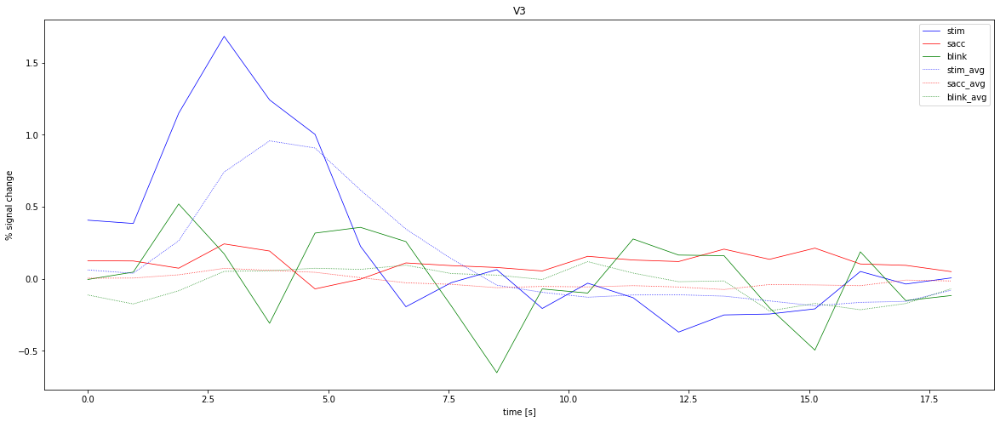

In [ ]:
responsive_V3_vertex_FIR_timecourses_stim = betas[1:21,[index_of_maximum_V3]]
responsive_V3_vertex_FIR_timecourses_sacc = betas[21:41,[index_of_maximum_V3]]
responsive_V3_vertex_FIR_timecourses_blink = betas[41:61,[index_of_maximum_V3]]

#average_time_courses
avg_v3_timecourse_stim = average_betas[1:21]
avg_v3_timecourse_sacc = average_betas[21:41]
avg_v3_timecourse_blink = average_betas[41:61]



plt.figure(figsize=(20,8))
for i, tc in enumerate(responsive_V3_vertex_FIR_timecourses_stim.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='b', lw=0.75, label='stim');
for i, tc in enumerate(responsive_V3_vertex_FIR_timecourses_sacc.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='r', lw=0.75, label='sacc');
for i, tc in enumerate(responsive_V3_vertex_FIR_timecourses_blink.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='g', lw=0.75, label='blink');

#the average ones
for i, tc in enumerate(avg_v3_timecourse_stim.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='b', lw=0.75, label='stim_avg');

for i, tc in enumerate(avg_v3_timecourse_sacc.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='r', lw=0.75, label='sacc_avg');

for i, tc in enumerate(avg_v3_timecourse_blink.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='g', lw=0.75, label='blink_avg');

plt.xlabel('time [s]')
plt.ylabel('% signal change');
plt.legend()
plt.title("V3")

Text(0.5, 1.0, 'Average signal change V3, including shaded Confidence Intervals')

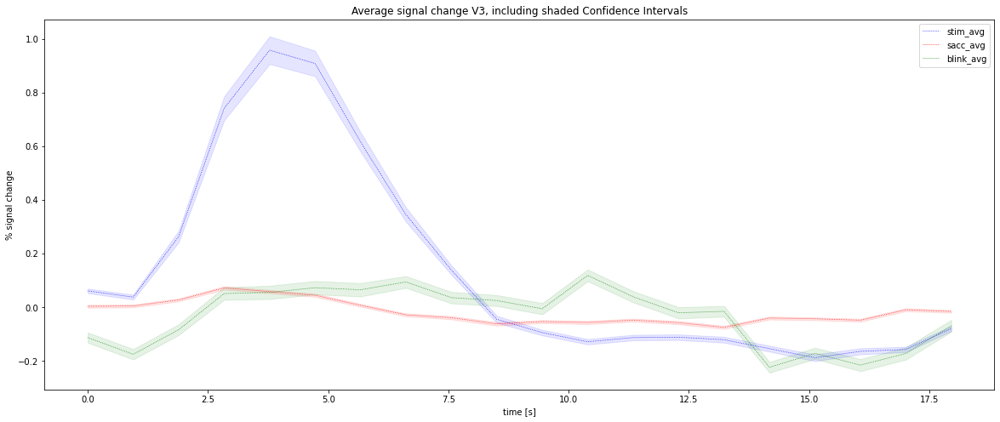

In [ ]:
plt.figure(figsize=(20,8))
for i, tc in enumerate(avg_v3_timecourse_stim.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='b', lw=0.75, label='stim_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_stim, upper_ci_stim, color='blue', alpha=0.1)

for i, tc in enumerate(avg_v3_timecourse_sacc.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='r', lw=0.75, label='sacc_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_sacc, upper_ci_sacc, color='r', alpha=0.1)

for i, tc in enumerate(avg_v3_timecourse_blink.T):
    #print(tc)
    plt.plot(np.arange(n_timepoints)*tr, tc, 'k:', c='g', lw=0.75, label='blink_avg');
    plt.fill_between(np.arange(n_timepoints)*tr, lower_ci_blink, upper_ci_blink, color='g', alpha=0.1)

plt.xlabel('time [s]')
plt.ylabel('% signal change');
plt.legend()
plt.title("Average signal change V3, including shaded Confidence Intervals")

#### T-value calculation

##### Old version

In [ ]:
def design_variance(X, which_predictor=1):
    ''' Returns the design variance of a predictor (or contrast) in X.
    
    Parameters
    ----------
    X : numpy array
        Array of shape (N, P)
    which_predictor : int or list/array
        The index of the predictor you want the design var from.
        Note that 0 refers to the intercept!
        Alternatively, "which_predictor" can be a contrast-vector
        (which will be discussed later this lab).
        
    Returns
    -------
    des_var : float
        Design variance of the specified predictor/contrast from X.
    '''
    
    is_single = isinstance(which_predictor, int)
    if is_single:
        idx = which_predictor
    else:
        idx = np.array(which_predictor) != 0
    
    c = np.zeros(X.shape[1])
    c[idx] = 1 if is_single == 1 else which_predictor[idx]
    des_var = c.dot(np.linalg.pinv(X.T.dot(X))).dot(c.T)
    return des_var

In [ ]:
  #V1_mask = atlas_data_both_hemis == 1 # here '1' resembles V3 according to the Atlas above
#responsive_V1_vertex = tseries_raw[V1_mask]
#responsive_V1_vertex = tseries_raw


tseries_psc = np.nan_to_num(psc(tseries_raw))
print(tseries_psc.shape)



#####


#calc betas
betas, _, _, _ = np.linalg.lstsq(glm_dmtest, tseries_psc.T)
print(betas.T.shape)
#print(betas.T)

#calc y_hat 
yhat = np.dot(betas.T, glm_dmtest.T)
print(yhat.shape)

#calc noise
N = 440   #or is it 440???
P = glm_dmtest.shape[1]
degrees_freedom = N - P
print(N)
print(P)
print(degrees_freedom)

### sigma/noise
noise = np.sum((tseries_psc - yhat) ** 2) / degrees_freedom
print(noise)

#Design variance
dv = design_variance(glm_dmtest, which_predictor=-11) #use formula above (implemented by myself)

#calc t-value
tval_all = betas / np.sqrt(noise * dv)
print(tval_all.shape)

# index of the right regressor columns
tval_a0 = tval_all[-11]
tval_a1 = tval_all[-10]
tval_a2 = tval_all[-9]
tval_a3 = tval_all[-8]
tval_a4 = tval_all[-7]
tval_a5 = tval_all[-6]

# print(tval_a0.shape)
# print("Min t for aCompCorr00: ", np.amin(tval_a0 ))
# print("Max t for aCompCorr00: ", np.amax(tval_a0 ))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in true_divide
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]


(118584, 440)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  from ipykernel import kernelapp as app


(118584, 82)
(118584, 440)
440
82
358
1.0806534683958499e+77
(82, 118584)


Failed to get connection
** (inkscape:3458): CRITICAL **: 11:14:26.368: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3458): CRITICAL **: 11:14:26.368: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3458): CRITICAL **: 11:14:26.368: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


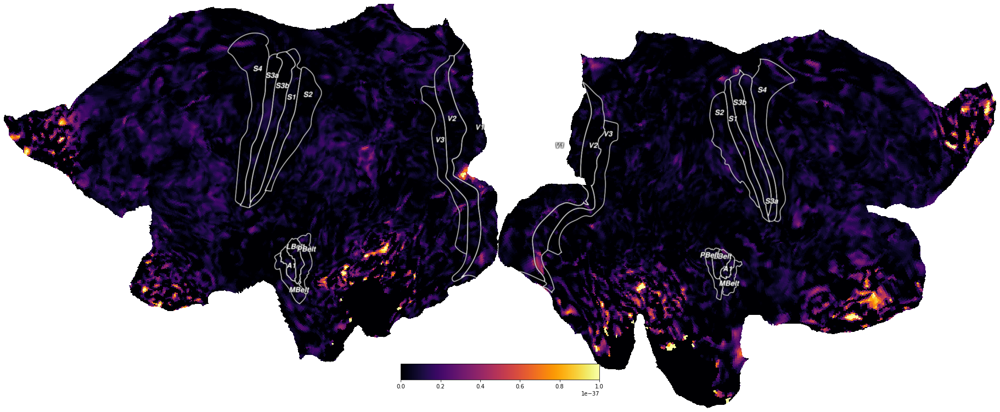

In [ ]:
cx.quickshow(cx.Vertex(tval_a0, subject='hcp_999999', cmap='inferno', vmin=0, vmax=0.0000000000000000000000000000000000001));

Failed to get connection
** (inkscape:3461): CRITICAL **: 11:14:30.556: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3461): CRITICAL **: 11:14:30.556: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3461): CRITICAL **: 11:14:30.556: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3464): CRITICAL **: 11:14:31.846: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3464): CRITICAL **: 11:14:31.846: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3464): CRITICAL **: 11:14:31.846: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


/usr/local/lib/python3.7/dist-packages/cortex/quickflat/composite.py:344: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar = fig.add_axes(colorbar_location)


Failed to get connection
** (inkscape:3467): CRITICAL **: 11:14:33.115: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3467): CRITICAL **: 11:14:33.115: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3467): CRITICAL **: 11:14:33.115: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


/usr/local/lib/python3.7/dist-packages/cortex/quickflat/composite.py:344: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar = fig.add_axes(colorbar_location)


Failed to get connection
** (inkscape:3472): CRITICAL **: 11:14:34.383: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3472): CRITICAL **: 11:14:34.383: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3472): CRITICAL **: 11:14:34.383: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


/usr/local/lib/python3.7/dist-packages/cortex/quickflat/composite.py:344: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar = fig.add_axes(colorbar_location)


Failed to get connection
** (inkscape:3475): CRITICAL **: 11:14:35.630: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3475): CRITICAL **: 11:14:35.630: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3475): CRITICAL **: 11:14:35.630: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


/usr/local/lib/python3.7/dist-packages/cortex/quickflat/composite.py:344: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar = fig.add_axes(colorbar_location)


Failed to get connection
** (inkscape:3478): CRITICAL **: 11:14:36.923: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3478): CRITICAL **: 11:14:36.924: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3478): CRITICAL **: 11:14:36.924: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


/usr/local/lib/python3.7/dist-packages/cortex/quickflat/composite.py:344: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar = fig.add_axes(colorbar_location)


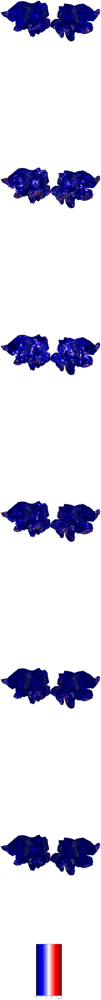

In [ ]:
f, sps = plt.subplots(6, 1, figsize=(15,150))

for i, t in enumerate(tval_all[-11:-5]):
    cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='seismic', vmin=0, vmax=0.0000000000000000000000000000000000001), fig=sps[i]);

##### New version

In [ ]:
def design_variance(X, which_predictor=1):
    ''' Returns the design variance of a predictor (or contrast) in X.
    
    Parameters
    ----------
    X : numpy array
        Array of shape (N, P)
    which_predictor : int or list/array
        The index of the predictor you want the design var from.
        Note that 0 refers to the intercept!
        Alternatively, "which_predictor" can be a contrast-vector
        (which will be discussed later this lab).
        
    Returns
    -------
    des_var : float
        Design variance of the specified predictor/contrast from X.
    '''
    
    is_single = isinstance(which_predictor, int)
    if is_single:
        idx = which_predictor
    else:
        idx = np.array(which_predictor) != 0
    
    c = np.zeros(X.shape[1])
    c[idx] = 1 if is_single == 1 else which_predictor[idx]
    des_var = c.dot(np.linalg.pinv(X.T.dot(X))).dot(c.T)
    return des_var

In [ ]:
tseries_psc = np.nan_to_num(psc(tseries_raw))
print(tseries_psc.shape, '\n')


#####


#calc betas
betas, _, _, _ = np.linalg.lstsq(glm_dmtest, tseries_psc.T)
print(betas.T.shape, '\n')

#calc y_hat 
yhat = np.dot(betas.T, glm_dmtest.T)
print(yhat.shape, '\n')

#calc noise
#N = tseries_psc.size   #or is it 440???
N = 440   #or is it 440???
P = glm_dmtest.shape[1]
degrees_freedom = N - P
print(N)
print(P)
print(degrees_freedom, '\n')

### sigma/noise
#noise = np.sum((tseries_psc - yhat) ** 2) / degrees_freedom
noise = np.sum((tseries_psc - yhat) ** 2, axis=1) / degrees_freedom
print(noise, '\n')

#Design variance
dv_a0 = design_variance(glm_dmtest, which_predictor=-11)
dv_a1 = design_variance(glm_dmtest, which_predictor=-10) 
dv_a2 = design_variance(glm_dmtest, which_predictor=-9) 
dv_a3 = design_variance(glm_dmtest, which_predictor=-8) 
dv_a4 = design_variance(glm_dmtest, which_predictor=-7) 
dv_a5 = design_variance(glm_dmtest, which_predictor=-6) 
print(dv_a0, '\n')

#calc t-values
tval_a0 = betas[-11] / np.sqrt(noise * dv_a0)
tval_a1 = betas[-10] / np.sqrt(noise * dv_a1)
tval_a2 = betas[-9] / np.sqrt(noise * dv_a2)
tval_a3 = betas[-8] / np.sqrt(noise * dv_a3)
tval_a4 = betas[-7] / np.sqrt(noise * dv_a4)
tval_a5 = betas[-6] / np.sqrt(noise * dv_a5)

tvals = [tval_a0, tval_a1, tval_a2, tval_a3, tval_a4, tval_a5]

# Below are just some checks:
print(tval_a0.shape) #the shape is different from the total surface voxels, because some noise equals 0.0, which means dividing by 0 results in NaN (so we skip those, cannot be plotted in the flatmap)
print(tval_a0)
print(np.nanmin(tval_a0))
print(np.nanmax(tval_a0))
print(np.count_nonzero(~np.isnan((betas[-11]/noise))), '\n')


# see if there's some noise that equals 0.0 (answer is = yes)
print('\n')
if 0.0 in noise:
  print("yes")
else:
  print('no')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in true_divide
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]


(118584, 440) 



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  if __name__ == '__main__':


(118584, 82) 

(118584, 440) 

440
82
358 

[ 1.39339829  0.35601683  0.70417699 ... 21.73311845  4.62297074
  5.19701371] 

3.2278614149157856 

(118584,)
[0.90231022 1.62638858 0.15540147 ... 1.01531665 1.2441381  2.22204336]
-11.951500249188598
13.569378701848663
116348 



yes


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: RuntimeWarning: invalid value encountered in true_divide


Failed to get connection
** (inkscape:3486): CRITICAL **: 11:15:02.796: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3486): CRITICAL **: 11:15:02.796: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3486): CRITICAL **: 11:15:02.796: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


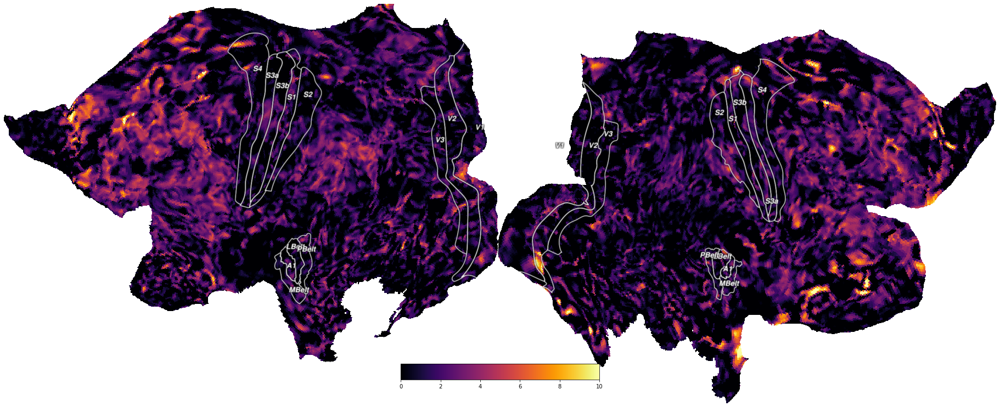

In [ ]:
# Inferno map to inspect tval_a0

cx.quickshow(cx.Vertex(tval_a0, subject='hcp_999999', cmap='inferno', vmin=0, vmax=10));

Failed to get connection
** (inkscape:3493): CRITICAL **: 11:15:07.260: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3493): CRITICAL **: 11:15:07.260: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3493): CRITICAL **: 11:15:07.260: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3496): CRITICAL **: 11:15:08.593: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3496): CRITICAL **: 11:15:08.593: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3496): CRITICAL **: 11:15:08.593: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


/usr/local/lib/python3.7/dist-packages/cortex/quickflat/composite.py:344: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar = fig.add_axes(colorbar_location)


Failed to get connection
** (inkscape:3499): CRITICAL **: 11:15:09.935: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3499): CRITICAL **: 11:15:09.935: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3499): CRITICAL **: 11:15:09.935: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


/usr/local/lib/python3.7/dist-packages/cortex/quickflat/composite.py:344: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar = fig.add_axes(colorbar_location)


Failed to get connection
** (inkscape:3502): CRITICAL **: 11:15:11.236: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3502): CRITICAL **: 11:15:11.236: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3502): CRITICAL **: 11:15:11.236: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


/usr/local/lib/python3.7/dist-packages/cortex/quickflat/composite.py:344: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar = fig.add_axes(colorbar_location)


Failed to get connection
** (inkscape:3505): CRITICAL **: 11:15:12.554: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3505): CRITICAL **: 11:15:12.554: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3505): CRITICAL **: 11:15:12.554: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


/usr/local/lib/python3.7/dist-packages/cortex/quickflat/composite.py:344: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar = fig.add_axes(colorbar_location)


Failed to get connection
** (inkscape:3508): CRITICAL **: 11:15:13.841: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3508): CRITICAL **: 11:15:13.841: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3508): CRITICAL **: 11:15:13.841: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


/usr/local/lib/python3.7/dist-packages/cortex/quickflat/composite.py:344: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cbar = fig.add_axes(colorbar_location)


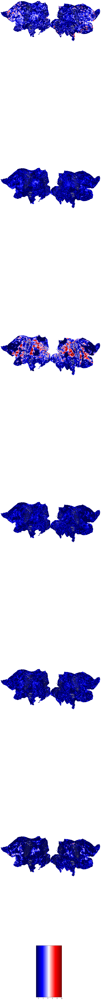

In [ ]:
# All 6 aCompCorr flatmaps plots

f, sps = plt.subplots(6, 1, figsize=(15,150))

for i, t in enumerate(tvals):
    cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='seismic', vmin=-1, vmax=10), fig=sps[i]);

# Question 4: HRF

In [ ]:
from nilearn.glm.first_level.hemodynamic_models import spm_hrf, spm_time_derivative, spm_dispersion_derivative


/usr/local/lib/python3.7/dist-packages/nilearn/glm/__init__.py:56: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  'It may change in any future release of Nilearn.', FutureWarning)


## Predictors

In [ ]:
# Creating the predictors

tr = 0.945

stim_times_tr = np.round(stim_times/tr).astype(int)
sacc_times_tr = np.round(sacc_times/tr).astype(int)
blink_times_tr = np.round(blink_times/tr).astype(int)

stim_pred = np.zeros((440,1))
stim_pred[stim_times_tr.astype(int)] = 1

sacc_pred = np.zeros((440,1))
sacc_pred[sacc_times_tr.astype(int)] = 1

blink_pred = np.zeros((440,1))
blink_pred[blink_times_tr.astype(int)] = 1

## Convolved predictors

In [ ]:
hrf = spm_hrf(0.945, oversampling=1, time_length=440)
hrf_time = spm_time_derivative(0.945, oversampling=1, time_length=440)
hrf_dispersion = spm_dispersion_derivative(0.945, oversampling=1, time_length=440)

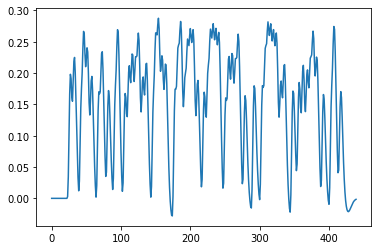

In [ ]:
# Convolved stim predictor

hrf_stim = np.convolve(stim_pred.squeeze(), hrf, 'full')[:stim_pred.size][:, np.newaxis]
hrf_stim_time = np.convolve(stim_pred.squeeze(), hrf_time, 'full')[:stim_pred.size][:, np.newaxis]
hrf_stim_dispersion = np.convolve(stim_pred.squeeze(), hrf_dispersion, 'full')[:stim_pred.size][:, np.newaxis]

convolved_stim = np.hstack((hrf_stim, hrf_stim_time, hrf_stim_dispersion))

plt.plot(hrf_stim)

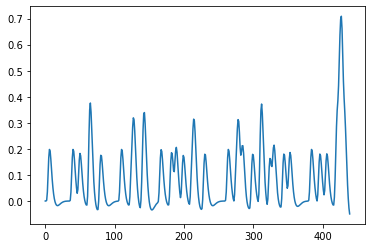

In [ ]:
# Convolved sacc predictor

hrf_sacc = np.convolve(sacc_pred.squeeze(), hrf, 'full')[:sacc_pred.size][:, np.newaxis]
hrf_sacc_time = np.convolve(sacc_pred.squeeze(), hrf_time, 'full')[:sacc_pred.size][:, np.newaxis]
hrf_sacc_dispersion = np.convolve(sacc_pred.squeeze(), hrf_dispersion, 'full')[:sacc_pred.size][:, np.newaxis]

convolved_sacc = np.hstack((hrf_sacc, hrf_sacc_time, hrf_sacc_dispersion))

plt.plot(hrf_sacc)

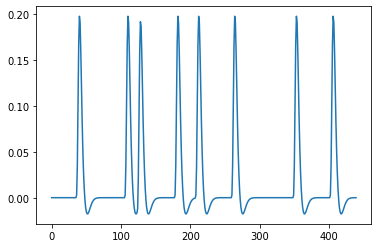

In [ ]:
# Convolved blink predictor

hrf_blink = np.convolve(blink_pred.squeeze(), hrf, 'full')[:blink_pred.size][:, np.newaxis]
hrf_blink_time = np.convolve(blink_pred.squeeze(), hrf_time, 'full')[:blink_pred.size][:, np.newaxis]
hrf_blink_dispersion = np.convolve(blink_pred.squeeze(), hrf_dispersion, 'full')[:blink_pred.size][:, np.newaxis]

convolved_blink = np.hstack((hrf_blink, hrf_blink_time, hrf_blink_dispersion))

plt.plot(hrf_blink)

In [ ]:
# Convolved design matrix

intercept = np.ones((hrf_stim.size))[:, np.newaxis]
hrf_glm = np.hstack((intercept, convolved_stim, convolved_sacc, convolved_blink))


## Best fitting voxels

R-squared value of best fitting voxel is: 0.785443 

index value of best fitting voxel is: 287 



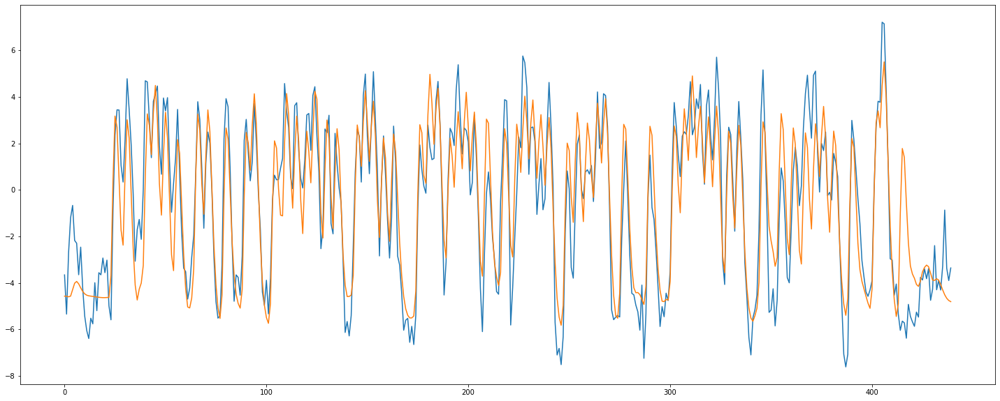

In [ ]:
# Check model fit for best fitting voxel in V1

V1_mask = atlas_data_both_hemis == 1 # here '1' resembles V1 according to the Atlas above
responsive_V1_vertex = tseries_raw[V1_mask]

tseries_psc = np.nan_to_num(psc(responsive_V1_vertex))

betas, _, _, _ = np.linalg.lstsq(hrf_glm, tseries_psc.T, rcond=None)

yhat = np.dot(betas.T, hrf_glm.T)
rsq = 1-(yhat-tseries_psc).var(1)/tseries_psc.var(1)

#Pick the best fitting voxel (with highest R-sqaured value) and return its index
maximum_V1 = np.nanmax(rsq)
print("R-squared value of best fitting voxel is: %f" % np.nanmax(rsq), '\n')
index_of_maximum_V1 = np.where(rsq == maximum_V1)[0][0]
print("index value of best fitting voxel is: %d" % index_of_maximum_V1, '\n')

plt.figure(figsize=(25, 10))
plt.plot(tseries_psc[index_of_maximum_V1])
plt.plot(yhat[index_of_maximum_V1])


R-squared value of best fitting voxel is: 0.738398 

index value of best fitting voxel is: 1404 



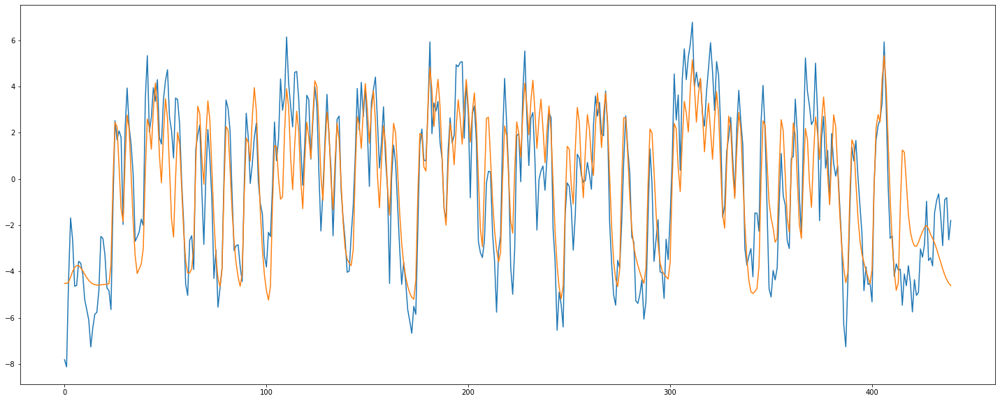

In [ ]:
# Check model fit for best fitting voxel in V2

V2_mask = atlas_data_both_hemis == 4
responsive_V2_vertex = tseries_raw[V2_mask]

tseries_psc = np.nan_to_num(psc(responsive_V2_vertex))

betas, _, _, _ = np.linalg.lstsq(hrf_glm, tseries_psc.T, rcond=None)

yhat = np.dot(betas.T, hrf_glm.T)
rsq = 1-(yhat-tseries_psc).var(1)/tseries_psc.var(1)

#self implemented
#Pick the best fitting voxel (with highest R-sqaured value) and return its index
maximum_V2 = np.nanmax(rsq)
print("R-squared value of best fitting voxel is: %f" % np.nanmax(rsq), '\n')
index_of_maximum_V2 = np.where(rsq == maximum_V2)[0][0]
print("index value of best fitting voxel is: %d" % index_of_maximum_V2, '\n')

plt.figure(figsize=(25, 10))
plt.plot(tseries_psc[index_of_maximum_V2])
plt.plot(yhat[index_of_maximum_V2])

R-squared value of best fitting voxel is: 0.709638 

index value of best fitting voxel is: 998 



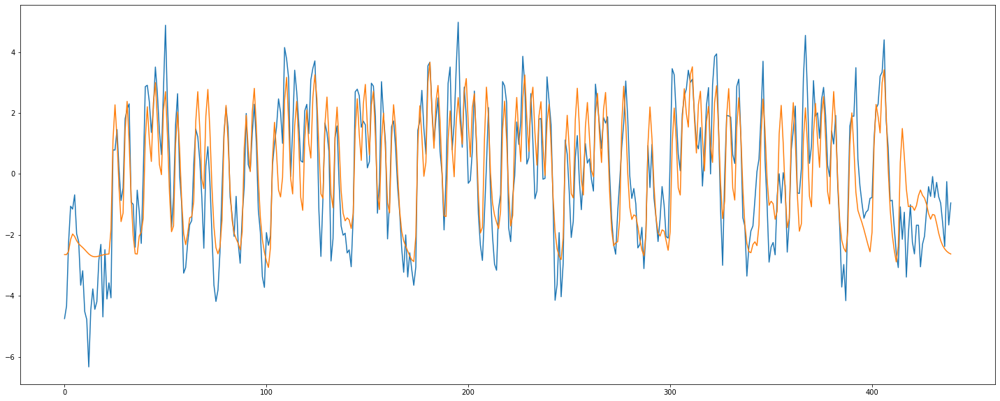

In [ ]:
# Check model fit for best fitting voxel in V3

V3_mask = atlas_data_both_hemis == 5
responsive_V3_vertex = tseries_raw[V3_mask]

tseries_psc = np.nan_to_num(psc(responsive_V3_vertex))

betas, _, _, _ = np.linalg.lstsq(hrf_glm, tseries_psc.T, rcond=None)

yhat = np.dot(betas.T, hrf_glm.T)
rsq = 1-(yhat-tseries_psc).var(1)/tseries_psc.var(1)

#Pick the best fitting voxel (with highest R-sqaured value) and return its index
maximum_V3 = np.nanmax(rsq)
print("R-squared value of best fitting voxel is: %f" % np.nanmax(rsq), '\n')
index_of_maximum_V3 = np.where(rsq == maximum_V3)[0][0]
print("index value of best fitting voxel is: %d" % index_of_maximum_V3, '\n')

plt.figure(figsize=(25, 10))
plt.plot(tseries_psc[index_of_maximum_V3])
plt.plot(yhat[index_of_maximum_V3])

# Report Outline

This part of the notebook outlines the sections we expect your report to contain. You can use this part as a to-be-filled-in template for your project report. The total text should not be too long, so that you don't needlessly pain your long-suffering colleagues. Say, 2000 words max. 



## Title 

a title is more important than you think - a good title draws the reader in. An excellent title is a bit playful without going over the top. Before you finish the report, spend a few minutes brainstorming on the perfect title. It pays off.

## Abstract

An abstract is a brief (say, around 200 words) summary of the research, methods, as well as the findings and their significance. 

## Introduction

Why this research? What does this specific experiment teach us about the brain? Be sure to discuss the articles that go with your project, and any and all additional articles that you've found. Feel free to add figures from published articles to clarify the approach. 

## Methods 

In the methods section, you should describe the experiment and your analyses in as much detail as possible, or at least to the level of detail required for others to replicate your findings. Clearly you don't have all the information regarding scanning parameters, etc, so we won't fault you for not including those here. 

## Results

It's easiest to base your results section around a few (say, 4 or 5) key figures that illustrate what you've done and what you've found. These can be illustrations, flatmaps, time-courses and/or anything that you decide is a cool visualization of your results. You can start with a description of the data as you're getting it, basing yourself on the *Questions concerning signal quality* etc. above. 

Be sure to describe your figures with adequate captions. For these results, we will focus on qualitative descriptions and not so much on hard stats - which are harder to do on single subjects. 

I hope you will have fun creating this project and I also hope that your findings will reflect the fun you have. 

## Discussion

*   What have we learned? 
*   What should others be aware of? 
*   In what sense do your findings correspond to the literature you know, and in what sense do your findings deviate from the canon? 

What have you learned?

Feel free to add references that you've stumbled upon yourselves. 